In [1]:
cd /orange/adamginsburg/jwst/brick/

/blue/adamginsburg/adamginsburg/jwst/brick


In [2]:
%matplotlib inline

In [3]:
basepath = '/orange/adamginsburg/jwst/brick/'

In [4]:
import sys
if '' in sys.path:
    sys.path.remove('')

In [5]:
%run $basepath/analysis/analysis_setup.py

/orange/adamginsburg/jwst/brick/analysis/analysis_setup.py:4: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  import sys, imp
/orange/adamginsburg/jwst/brick//reduction/filtering.py:20: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm
**WARNING**: LOCAL JWST PRD VERSION PRDOPSSOC-059 CANNOT BE CHECKED AGAINST ONLINE VERSION
Set OBSGEO-B to   -20.646359 from OBSGEO-[XYZ].
Set OBSGEO-H to 1526234830.949 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2022-08-28T03:05:33.037' from MJD-AVG.
Set DATE-END to '2022-08-28T03:34:03.365' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -20.643813 from OBSGEO-[XYZ].
Set OBSGEO-H to 1526204922.487 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set OBSGEO-B to   -20.631897 from OBSGEO-[XYZ].
Set OBSGEO-H to 1526059356.900 from OBSGEO-[XYZ]

For module nrca catalog crowdsource_nsky0_nrca_photometry_tables_merged.fits, mod date is 2023-07-09 17:03:44
For module nrcb catalog crowdsource_nsky0_nrcb_photometry_tables_merged.fits, mod date is 2023-07-09 17:47:55
For module merged catalog crowdsource_nsky0_merged_photometry_tables_merged.fits, mod date is 2023-07-09 16:11:57
For module merged-reproject catalog crowdsource_nsky0_merged-reproject_photometry_tables_merged.fits, mod date is 2023-07-10 10:28:07


In [6]:
%run $basepath/analysis/selections.py --module=merged-reproject

For module nrca catalog crowdsource_nsky0_nrca_photometry_tables_merged.fits, mod date is 2023-07-09 17:03:44
For module nrcb catalog crowdsource_nsky0_nrcb_photometry_tables_merged.fits, mod date is 2023-07-09 17:47:55
For module merged catalog crowdsource_nsky0_merged_photometry_tables_merged.fits, mod date is 2023-07-09 16:11:57
For module merged-reproject catalog crowdsource_nsky0_merged-reproject_photometry_tables_merged.fits, mod date is 2023-07-10 10:28:07
Selecting module merged-reproject

NRCA
612 saturated in near_saturated_f212n_f212n
32 saturated in near_saturated_f466n_f466n
498 saturated in near_saturated_f405n_f405n
278 saturated in near_saturated_f187n_f187n
2757 saturated in near_saturated_f182m_f182m
6061 near saturated out of 295443.  That leaves 289382 not near unsaturated
70 saturated in replaced_saturated_f212n
9 saturated in replaced_saturated_f466n
125 saturated in replaced_saturated_f405n
19 saturated in replaced_saturated_f187n
117 saturated in replaced_satura

DONE

TODO: change nrca to merged and then make both merged and nrcb figures and see why they weird


first examination shows that stars from the merged cat are crap in the NRCA field


this seems to be done

## Diagnostic plots

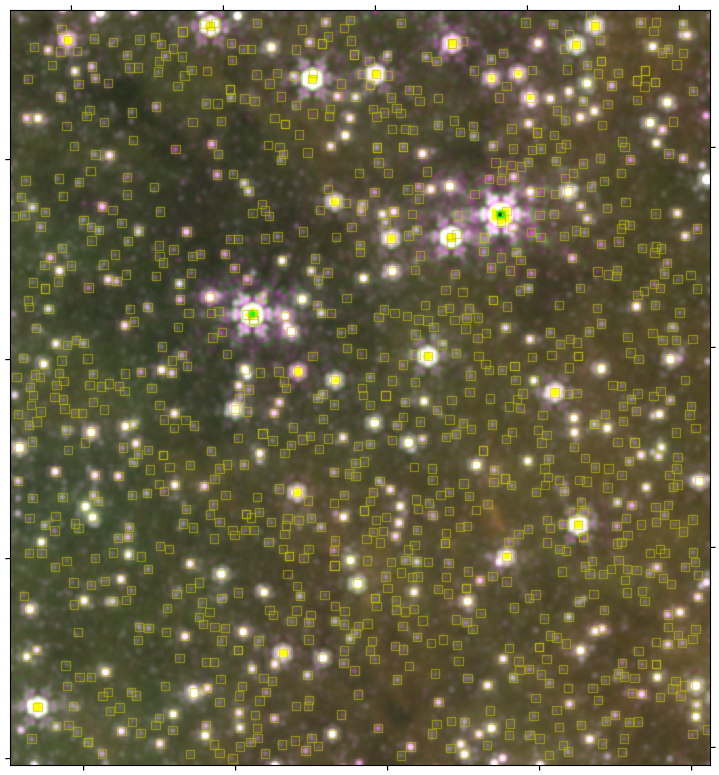

In [7]:
mask = reg.to_pixel(wwi).to_mask()
slcs,_ = mask.get_overlap_slices(img.shape[:2])
#co = np.array([mask.cutout(img[:,:,ii]) for ii in range(img.shape[2])])
co = img[slcs[0], slcs[1], :]

pl.figure(figsize=(10,10))
ax = pl.subplot(projection=wwi[slcs])
pl.imshow(co)

crds = basetable['skycoord_f410m']
sel = reg.contains(crds, ww410)
xx,yy = ww410[slcs].world_to_pixel(crds[sel])

colorby = basetable['flux_f410m']
colorby = basetable['mag_ab_f410m'] - basetable['mag_ab_f405n']
#sel = sel & (colorby > 2)
sel &= basetable['sep_f405n'].quantity < 0.1*u.arcsec

scat = ax.scatter(crds.ra[sel], crds.dec[sel], transform=ax.get_transform('world'),
                  edgecolor='y', facecolor='none', marker='s',
                  alpha=0.5)#r'$\rightarrow$')
                  #c=colorby[sel],
                  #norm=simple_norm(colorby[sel], stretch='linear',), cmap='jet')
#pl.draw()
#colors = scat.get_facecolors()
#scat.set_edgecolors(colors)
#scat.set_facecolors('none')

(25.0, 14.0)

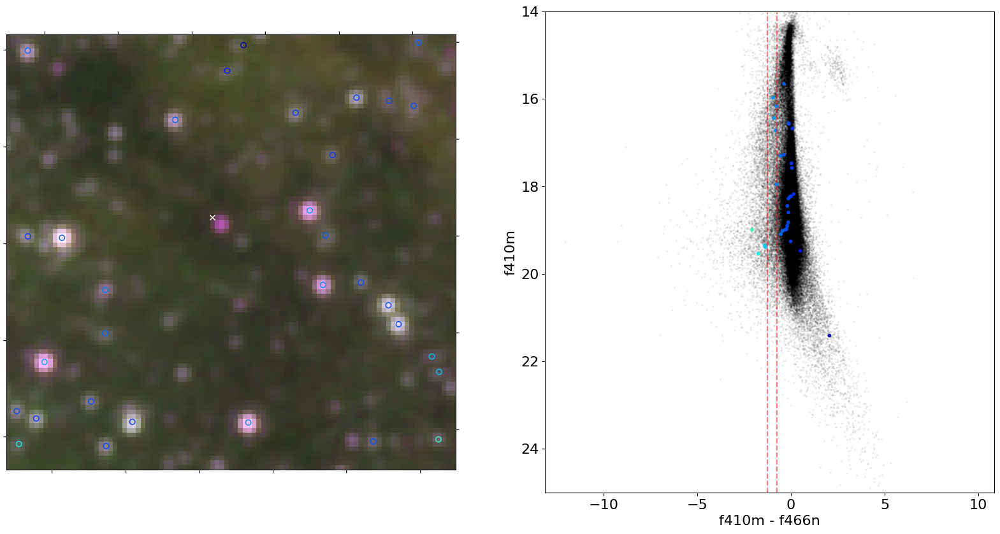

In [8]:
mask = regzoom.to_pixel(wwi).to_mask()
slcs,_ = mask.get_overlap_slices(img.shape[:2])
#co = np.array([mask.cutout(img[:,:,ii]) for ii in range(img.shape[2])])
co = img[slcs[0], slcs[1], :]

pl.figure(figsize=(20,10))
ax = pl.subplot(1,2,1, projection=wwi[slcs])
pl.imshow(co)

crds = basetable['skycoord_f410m']
sel = regzoom.contains(crds, ww410)
sel &= basetable['sep_f405n'].quantity < 0.1*u.arcsec
xx,yy = ww410[slcs].world_to_pixel(crds[sel])

colorby = basetable['flux_f410m']
colorby = basetable['mag_ab_f410m'] - basetable['mag_ab_f405n']
colorby = basetable['mag_ab_f410m'] - basetable['mag_ab_f466n']
#sel = sel & (colorby < -2)

scat = ax.scatter(crds.ra[sel], crds.dec[sel], transform=ax.get_transform('world'),
                  #edgecolor='r', facecolor='none', marker='s')#r'$\rightarrow$')
                  c=colorby[sel],
                  norm=simple_norm(colorby[sel], stretch='asinh', min_cut=-4, max_cut=3), cmap='jet_r')
pl.draw()
colors = scat.get_facecolors()
scat.set_edgecolors(colors)
scat.set_facecolors('none')
#pl.colorbar(mappable=scat)
ax.axis()
pl.plot(44,54, 'wx')
wwi[slcs].pixel_to_world(45,55)

ax2 = pl.subplot(1,2,2)
ax2.scatter(basetable['mag_ab_f410m'] - basetable['mag_ab_f466n'], basetable['mag_ab_f410m'], s=2, alpha=0.05, c='k')
ax2.scatter((basetable['mag_ab_f410m'] - basetable['mag_ab_f466n'])[sel], basetable['mag_ab_f410m'][sel], s=10, alpha=0.9,
            c=colorby[sel],
            norm=simple_norm(colorby[sel], stretch='asinh', min_cut=-4, max_cut=3), cmap='jet_r'
           )
ax2.axvline(-0.75, linestyle='--', color='r', alpha=0.5)
ax2.axvline(-1.25, linestyle='--', color='r', alpha=0.5)
ax2.set_ylim(pl.ylim()[::-1])
ax2.set_xlabel("f410m - f466n")
ax2.set_ylabel("f410m")
ax2.set_ylim(25,14)

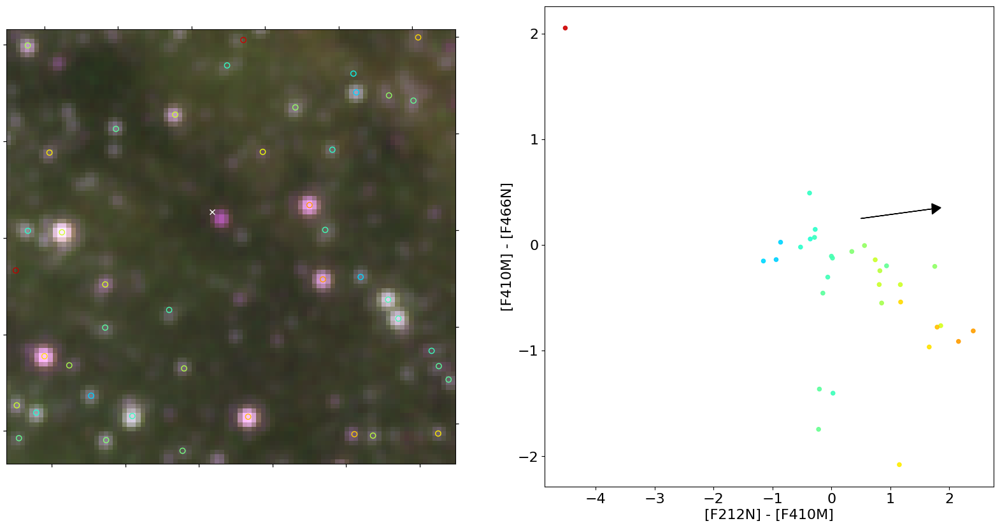

In [9]:
mask = regzoom.to_pixel(wwi).to_mask()
slcs,_ = mask.get_overlap_slices(img.shape[:2])
#co = np.array([mask.cutout(img[:,:,ii]) for ii in range(img.shape[2])])
co = img[slcs[0], slcs[1], :]

pl.figure(figsize=(20,10))
ax = pl.subplot(1,2,1, projection=wwi[slcs])
pl.imshow(co)

crds = basetable['skycoord_f410m']
sel = regzoom.contains(crds, ww410)
sel &= basetable['sep_f405n'].quantity < 0.1*u.arcsec
xx,yy = ww410[slcs].world_to_pixel(crds[sel])

#colorby = basetable['flux_f410m']
#colorby = basetable['mag_ab_f410m'] - basetable['mag_ab_f405n']
#colorby = basetable['mag_ab_f410m'] - basetable['mag_ab_f466n']
colorby = basetable['mag_ab_f182m'] - basetable['mag_ab_f212n']
#sel = sel & (colorby < -2)

colornorm = simple_norm(colorby[sel], stretch='asinh', min_cut=0, max_cut=5)

scat = ax.scatter(crds.ra[sel], crds.dec[sel], transform=ax.get_transform('world'),
                  #edgecolor='r', facecolor='none', marker='s')#r'$\rightarrow$')
                  c=colorby[sel],
                  norm=colornorm, cmap='jet')
pl.draw()
colors = scat.get_facecolors()
scat.set_edgecolors(colors)
scat.set_facecolors('none')
#pl.colorbar(mappable=scat)
ax.axis()
pl.plot(44,54, 'wx')
wwi[slcs].pixel_to_world(45,55)

ax2 = pl.subplot(1,2,2)
#ax2.scatter(basetable['mag_ab_f410m'] - basetable['mag_ab_f466n'], basetable['mag_ab_f410m'], s=2, alpha=0.05, c='k')
ax2.scatter((basetable['mag_ab_f212n'] - basetable['mag_ab_f410m'])[sel],
            (basetable['mag_ab_f410m'] - basetable['mag_ab_f466n'])[sel],
            s=20, alpha=0.9,
            c=colorby[sel],
            norm=colornorm, cmap='jet'
           )

import plot_tools
imp.reload(plot_tools)
from plot_tools import regzoomplot, starzoom, ccd, ccds, cmds, plot_extvec_ccd


plot_extvec_ccd(ax2, ('f212n', 'f410m'), ('f410m', 'f466n'), start=(0.5, 0.25,), color='k', extvec_scale=20, head_width=0.1)

#ax2.axvline(-0.75, linestyle='--', color='r', alpha=0.5)
#ax2.axvline(-1.25, linestyle='--', color='r', alpha=0.5)
#ax2.set_ylim(pl.ylim()[::-1])
ax2.set_ylabel("[F410M] - [F466N]")
ax2.set_xlabel("[F212N] - [F410M]");
#ax2.set_ylim(25,14)

# 410-466 color is anticorrelated with extinction

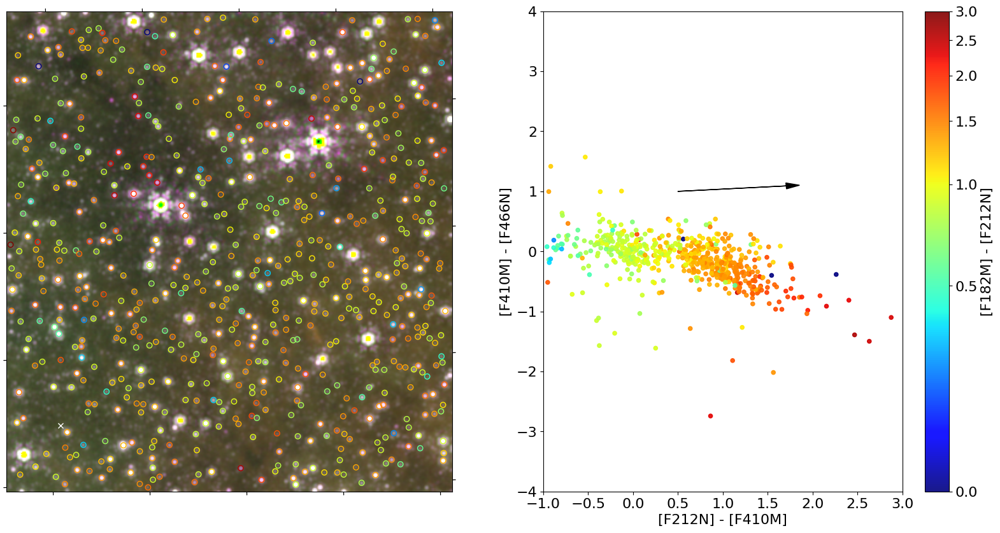

In [10]:
mask = reg.to_pixel(wwi).to_mask()
slcs,_ = mask.get_overlap_slices(img.shape[:2])
#co = np.array([mask.cutout(img[:,:,ii]) for ii in range(img.shape[2])])
co = img[slcs[0], slcs[1], :]

pl.figure(figsize=(20,10))
ax = pl.subplot(1,2,1, projection=wwi[slcs])
pl.imshow(co)

crds = basetable['skycoord_f410m']
sel = reg.contains(crds, ww410)
sel &= basetable['sep_f405n'].quantity < 0.1*u.arcsec
sel &= long_good & (~any_saturated)
xx,yy = ww410[slcs].world_to_pixel(crds[sel])

#colorby = basetable['flux_f410m']
#colorby = basetable['mag_ab_f410m'] - basetable['mag_ab_f405n']
#colorby = basetable['mag_ab_f410m'] - basetable['mag_ab_f466n']
colorby = basetable['mag_ab_f182m'] - basetable['mag_ab_f212n']
#sel = sel & (colorby < -2)

colornorm = simple_norm(colorby[sel], stretch='asinh', min_cut=0, max_cut=3)

scat = ax.scatter(crds.ra[sel], crds.dec[sel], transform=ax.get_transform('world'),
                  #edgecolor='r', facecolor='none', marker='s')#r'$\rightarrow$')
                  c=colorby[sel],
                  norm=colornorm, cmap='jet')
pl.draw()
colors = scat.get_facecolors()
scat.set_edgecolors(colors)
scat.set_facecolors('none')
#pl.colorbar(mappable=scat)
ax.axis()
pl.plot(44,54, 'wx')
wwi[slcs].pixel_to_world(45,55)

ax2 = pl.subplot(1,2,2)
#ax2.scatter(basetable['mag_ab_f410m'] - basetable['mag_ab_f466n'], basetable['mag_ab_f410m'], s=2, alpha=0.05, c='k')
sc = ax2.scatter((basetable['mag_ab_f212n'] - basetable['mag_ab_f410m'])[sel],
            (basetable['mag_ab_f410m'] - basetable['mag_ab_f466n'])[sel],
            s=20, alpha=0.9,
            c=colorby[sel],
            norm=colornorm, cmap='jet'
           )
plot_extvec_ccd(ax2, ('f212n', 'f410m'), ('f410m', 'f466n'), start=(0.5,1,), color='k', extvec_scale=20, head_width=0.1)
cb = pl.colorbar(mappable=sc)
cb.set_label("[F182M] - [F212N]")
#ax2.axvline(-0.75, linestyle='--', color='r', alpha=0.5)
#ax2.axvline(-1.25, linestyle='--', color='r', alpha=0.5)
#ax2.set_ylim(pl.ylim()[::-1])
ax2.set_ylabel("[F410M] - [F466N]")
ax2.set_xlabel("[F212N] - [F410M]");
ax2.axis((-1,3,-4,4));

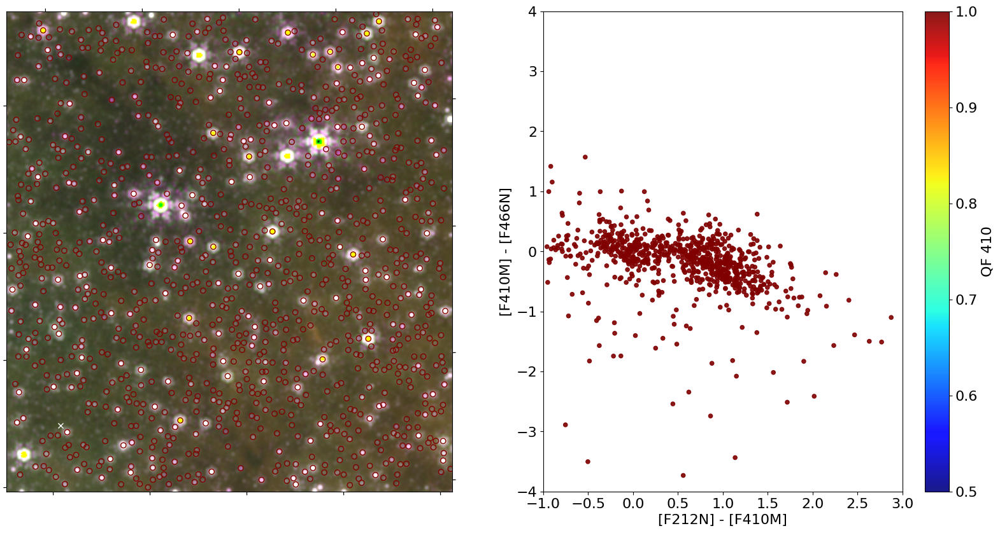

In [11]:
# QF analysis
mask = reg.to_pixel(wwi).to_mask()
slcs,_ = mask.get_overlap_slices(img.shape[:2])
co = img[slcs[0], slcs[1], :]

pl.figure(figsize=(20,10))
ax = pl.subplot(1,2,1, projection=wwi[slcs])
pl.imshow(co)

crds = basetable['skycoord_f410m']
sel = reg.contains(crds, ww410)
sel &= basetable['sep_f405n'].quantity < 0.1*u.arcsec
#sel &= long_good & (~any_saturated)
xx,yy = ww410[slcs].world_to_pixel(crds[sel])

colorby = basetable['qf_f410m']

colornorm = simple_norm(colorby[sel], min_cut=0.5,)

scat = ax.scatter(crds.ra[sel], crds.dec[sel], transform=ax.get_transform('world'),
                  #edgecolor='r', facecolor='none', marker='s')#r'$\rightarrow$')
                  c=colorby[sel],
                  norm=colornorm, cmap='jet')
pl.draw()
colors = scat.get_facecolors()
scat.set_edgecolors(colors)
scat.set_facecolors('none')
#pl.colorbar(mappable=scat)
ax.axis()
pl.plot(44,54, 'wx')
wwi[slcs].pixel_to_world(45,55)

ax2 = pl.subplot(1,2,2)
#ax2.scatter(basetable['mag_ab_f410m'] - basetable['mag_ab_f466n'], basetable['mag_ab_f410m'], s=2, alpha=0.05, c='k')
sc = ax2.scatter((basetable['mag_ab_f212n'] - basetable['mag_ab_f410m'])[sel],
            (basetable['mag_ab_f410m'] - basetable['mag_ab_f466n'])[sel],
            s=20, alpha=0.9,
            c=colorby[sel],
            norm=colornorm, cmap='jet'
           )
cb = pl.colorbar(mappable=sc)
cb.set_label("QF 410")
#ax2.axvline(-0.75, linestyle='--', color='r', alpha=0.5)
#ax2.axvline(-1.25, linestyle='--', color='r', alpha=0.5)
#ax2.set_ylim(pl.ylim()[::-1])
ax2.set_ylabel("[F410M] - [F466N]")
ax2.set_xlabel("[F212N] - [F410M]");
ax2.axis((-1,3,-4,4));

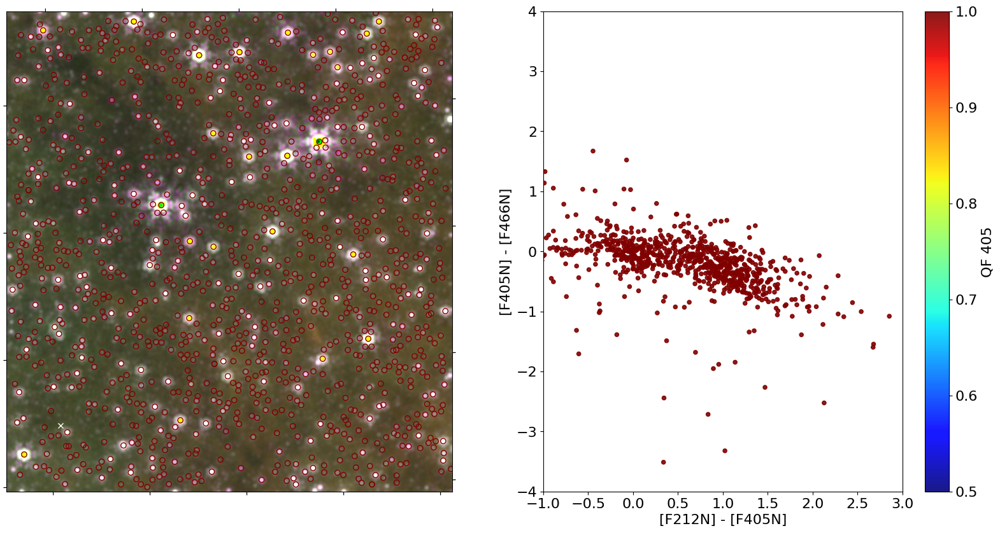

In [12]:
# QF analysis - check f405n, see if same behavior as f410m (should be)
mask = reg.to_pixel(wwi).to_mask()
slcs,_ = mask.get_overlap_slices(img.shape[:2])
co = img[slcs[0], slcs[1], :]

pl.figure(figsize=(20,10))
ax = pl.subplot(1,2,1, projection=wwi[slcs])
pl.imshow(co)

crds = basetable['skycoord_f405n']
sel = reg.contains(crds, ww410)
sel &= basetable['sep_f405n'].quantity < 0.1*u.arcsec
#sel &= long_good & (~any_saturated)
xx,yy = ww410[slcs].world_to_pixel(crds[sel])

colorby = basetable['qf_f405n']

colornorm = simple_norm(colorby[sel], min_cut=0.5,)

scat = ax.scatter(crds.ra[sel], crds.dec[sel], transform=ax.get_transform('world'),
                  #edgecolor='r', facecolor='none', marker='s')#r'$\rightarrow$')
                  c=colorby[sel],
                  norm=colornorm, cmap='jet')
pl.draw()
colors = scat.get_facecolors()
scat.set_edgecolors(colors)
scat.set_facecolors('none')
#pl.colorbar(mappable=scat)
ax.axis()
pl.plot(44,54, 'wx')
wwi[slcs].pixel_to_world(45,55)

ax2 = pl.subplot(1,2,2)
#ax2.scatter(basetable['mag_ab_f405n'] - basetable['mag_ab_f466n'], basetable['mag_ab_f405n'], s=2, alpha=0.05, c='k')
sc = ax2.scatter((basetable['mag_ab_f212n'] - basetable['mag_ab_f405n'])[sel],
            (basetable['mag_ab_f405n'] - basetable['mag_ab_f466n'])[sel],
            s=20, alpha=0.9,
            c=colorby[sel],
            norm=colornorm, cmap='jet'
           )
cb = pl.colorbar(mappable=sc)
cb.set_label("QF 405")
#ax2.axvline(-0.75, linestyle='--', color='r', alpha=0.5)
#ax2.axvline(-1.25, linestyle='--', color='r', alpha=0.5)
#ax2.set_ylim(pl.ylim()[::-1])
ax2.set_ylabel("[F405N] - [F466N]")
ax2.set_xlabel("[F212N] - [F405N]");
ax2.axis((-1,3,-4,4));

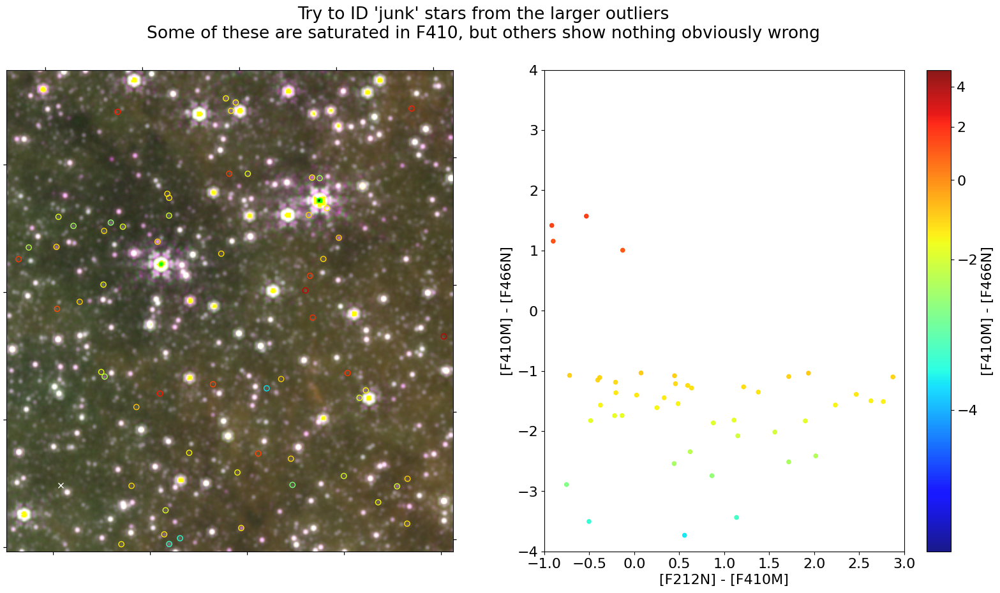

In [13]:
# ATTEMPT TO ID SOME JUNK

mask = reg.to_pixel(wwi).to_mask()
slcs,_ = mask.get_overlap_slices(img.shape[:2])
#co = np.array([mask.cutout(img[:,:,ii]) for ii in range(img.shape[2])])
co = img[slcs[0], slcs[1], :]

pl.figure(figsize=(20,10))
ax = pl.subplot(1,2,1, projection=wwi[slcs])
pl.imshow(co)

crds = basetable['skycoord_f410m']
sel = reg.contains(crds, ww410)
sel &= basetable['sep_f405n'].quantity < 0.1*u.arcsec
sel &= (basetable['mag_ab_f410m'] - basetable['mag_ab_f466n'] > 1) | (basetable['mag_ab_f410m'] - basetable['mag_ab_f466n'] < -1)
xx,yy = ww410[slcs].world_to_pixel(crds[sel])

#colorby = basetable['flux_f410m']
#colorby = basetable['mag_ab_f410m'] - basetable['mag_ab_f405n']
#colorby = basetable['mag_ab_f410m'] - basetable['mag_ab_f466n']
colorby = basetable['mag_ab_f182m'] - basetable['mag_ab_f212n']
colorby = basetable['mag_ab_f410m'] - basetable['mag_ab_f466n']
#sel = sel & (colorby < -2)

colornorm = simple_norm(colorby[sel], stretch='asinh', min_cut=-5, max_cut=5)

scat = ax.scatter(crds.ra[sel], crds.dec[sel], transform=ax.get_transform('world'),
                  #edgecolor='r', facecolor='none', marker='s')#r'$\rightarrow$')
                  c=colorby[sel],
                  norm=colornorm, cmap='jet')
pl.draw()
colors = scat.get_facecolors()
scat.set_edgecolors(colors)
scat.set_facecolors('none')
#pl.colorbar(mappable=scat)
ax.axis()
pl.plot(44,54, 'wx')
wwi[slcs].pixel_to_world(45,55)

ax2 = pl.subplot(1,2,2)
#ax2.scatter(basetable['mag_ab_f410m'] - basetable['mag_ab_f466n'], basetable['mag_ab_f410m'], s=2, alpha=0.05, c='k')
sc = ax2.scatter((basetable['mag_ab_f212n'] - basetable['mag_ab_f410m'])[sel],
            (basetable['mag_ab_f410m'] - basetable['mag_ab_f466n'])[sel],
            s=20, alpha=0.9,
            c=colorby[sel],
            norm=colornorm, cmap='jet'
           )
cb = pl.colorbar(mappable=sc)
cb.set_label("[F410M] - [F466N]")
#ax2.axvline(-0.75, linestyle='--', color='r', alpha=0.5)
#ax2.axvline(-1.25, linestyle='--', color='r', alpha=0.5)
#ax2.set_ylim(pl.ylim()[::-1])
ax2.set_ylabel("[F410M] - [F466N]")
ax2.set_xlabel("[F212N] - [F410M]");
ax2.axis((-1,3,-4,4));
pl.suptitle("Try to ID 'junk' stars from the larger outliers\nSome of these are saturated in F410, but others show nothing obviously wrong");

# Full(er) field CMDs

In [14]:
-28-42/60-45.77/3600

-28.71271388888889

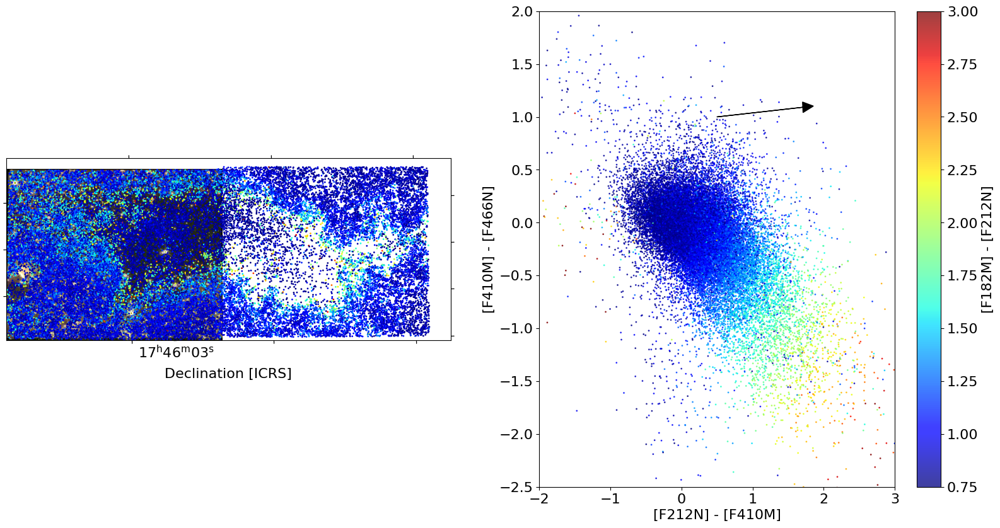

In [15]:
# Zoom OUT
co = img

pl.figure(figsize=(20,10))
ax = pl.subplot(1,2,1, projection=wwi)
pl.imshow(co)

crds = basetable['skycoord_f410m']
sel = basetable['sep_f405n'].quantity < 0.1*u.arcsec
sel &= basetable['sep_f466n'].quantity < 0.1*u.arcsec
# NRCA selection: sel &= crds.dec < -28.71271388888889*u.deg
sel &= (~any_saturated) & (any_good) & long_good & ~bad
xx,yy = ww410.world_to_pixel(crds[sel])

#colorby = basetable['flux_f410m']
#colorby = basetable['mag_ab_f410m'] - basetable['mag_ab_f405n']
#colorby = basetable['mag_ab_f410m'] - basetable['mag_ab_f466n']
colorby = basetable['mag_ab_f182m'] - basetable['mag_ab_f212n']
#sel = sel & (colorby < -2)


# show only extincted sources
mincut = 0.75
sel &= colorby > mincut

colornorm = simple_norm(colorby[sel], stretch='linear', min_cut=mincut, max_cut=3)
cmap = 'jet'

scat = ax.scatter(crds.ra[sel], crds.dec[sel], transform=ax.get_transform('world'),
                  #edgecolor='r', facecolor='none', marker='s')#r'$\rightarrow$')
                  c=colorby[sel],
                  s=1,
                  norm=colornorm, cmap=cmap)
pl.draw()
colors = scat.get_facecolors()
scat.set_edgecolors(colors)
scat.set_facecolors('none')
ax.axis()
ax.set_ylabel("Right Ascension [ICRS]")
ax.set_xlabel("Declination [ICRS]")

ax2 = pl.subplot(1,2,2)
#ax2.scatter(basetable['mag_ab_f410m'] - basetable['mag_ab_f466n'], basetable['mag_ab_f410m'], s=2, alpha=0.05, c='k')
sc = ax2.scatter((basetable['mag_ab_f212n'] - basetable['mag_ab_f410m'])[sel],
            (basetable['mag_ab_f410m'] - basetable['mag_ab_f466n'])[sel],
            s=1, alpha=0.75,
            c=colorby[sel],
            norm=colornorm, cmap=cmap
           )
plot_extvec_ccd(ax2, ('f212n', 'f410m'), ('f410m', 'f466n'), start=(0.5,1,), color='k', extvec_scale=20, head_width=0.1)

cb = pl.colorbar(mappable=sc)
cb.set_label("[F182M] - [F212N]")
#ax2.axvline(-0.75, linestyle='--', color='r', alpha=0.5)
#ax2.axvline(-1.25, linestyle='--', color='r', alpha=0.5)
#ax2.set_ylim(pl.ylim()[::-1])
ax2.set_ylabel("[F410M] - [F466N]")
ax2.set_xlabel("[F212N] - [F410M]");
ax2.axis((-2,3,-2.5,2));

## Paper Plot: ColorColorDiagram_WithSourceMap_212-410-466-c182

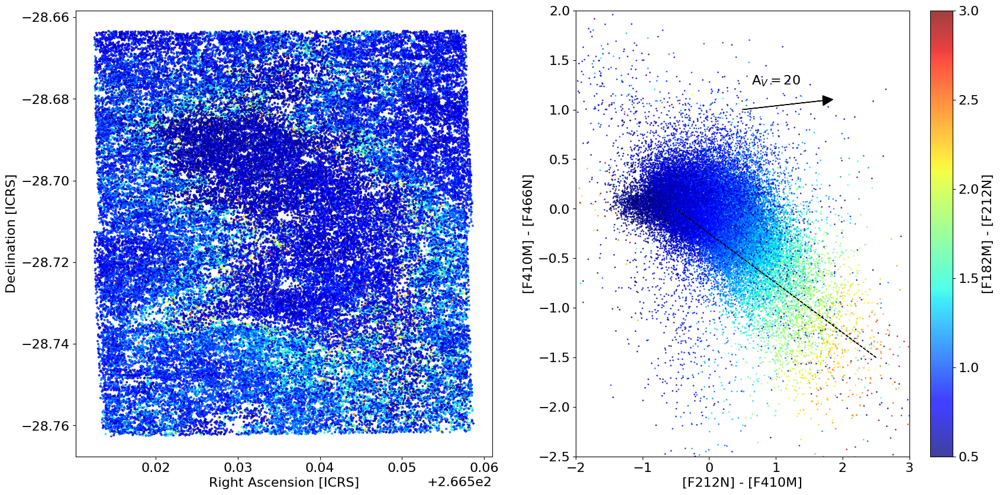

In [16]:
# Zoom OUT
co = img

pl.figure(figsize=(20,10))
ax = pl.subplot(1,2,1)
#pl.imshow(co)

crds = basetable['skycoord_f410m']
sel = basetable['sep_f405n'].quantity < 0.1*u.arcsec
sel &= (~any_saturated) & (any_good) & long_good & ~bad
xx,yy = ww410.world_to_pixel(crds[sel])

#colorby = basetable['flux_f410m']
#colorby = basetable['mag_ab_f410m'] - basetable['mag_ab_f405n']
#colorby = basetable['mag_ab_f410m'] - basetable['mag_ab_f466n']
colorby = basetable['mag_ab_f182m'] - basetable['mag_ab_f212n']
#sel = sel & (colorby < -2)

colornorm = simple_norm(colorby[sel], stretch='linear', min_cut=0.5, max_cut=3)
cmap = 'jet'

scat = ax.scatter(crds.ra[sel], crds.dec[sel], #transform=ax.get_transform('world'),
                  #edgecolor='r', facecolor='none', marker='s')#r'$\rightarrow$')
                  c=colorby[sel],
                  s=3,
                  norm=colornorm, cmap=cmap)
pl.draw()
colors = scat.get_facecolors()
scat.set_edgecolors(colors)
scat.set_facecolors('none')
ax.axis()
ax.set_xlabel("Right Ascension [ICRS]")
ax.set_ylabel("Declination [ICRS]")

ax2 = pl.subplot(1,2,2)
#ax2.scatter(basetable['mag_ab_f410m'] - basetable['mag_ab_f466n'], basetable['mag_ab_f410m'], s=2, alpha=0.05, c='k')
sc = ax2.scatter((basetable['mag_ab_f212n'] - basetable['mag_ab_f410m'])[sel],
            (basetable['mag_ab_f410m'] - basetable['mag_ab_f466n'])[sel],
            s=1, alpha=0.75,
            c=colorby[sel],
            norm=colornorm, cmap=cmap
           )
plot_extvec_ccd(ax2, ('f212n', 'f410m'), ('f410m', 'f466n'), start=(0.5,1,), color='k', extvec_scale=20, head_width=0.1)

cb = pl.colorbar(mappable=sc)
cb.set_label("[F182M] - [F212N]")
#ax2.axvline(-0.75, linestyle='--', color='r', alpha=0.5)
#ax2.axvline(-1.25, linestyle='--', color='r', alpha=0.5)
#ax2.set_ylim(pl.ylim()[::-1])
ax2.set_ylabel("[F410M] - [F466N]")
ax2.set_xlabel("[F212N] - [F410M]");
ax2.axis((-2,3,-2.5,2));
ax2.text(1, 1.25, "A$_V = 20$", ha='center')
pl.savefig(f"{basepath}/paper_co/figures/ColorColorDiagram_WithSourceMap_212-410-466-c182.pdf", dpi=150, bbox_inches='tight')
pl.savefig(f"{basepath}/paper_co/figures/ColorColorDiagram_WithSourceMap_212-410-466-c182.png", dpi=150, bbox_inches='tight')
ax2.arrow(-0.5, 0, 3, -1.5, linestyle='--')
pl.savefig(f"{basepath}/paper_co/figures/ColorColorDiagram_WithSourceMap_212-410-466-c182_withvector.pdf", dpi=150, bbox_inches='tight')
pl.savefig(f"{basepath}/paper_co/figures/ColorColorDiagram_WithSourceMap_212-410-466-c182_withvector.png", dpi=150, bbox_inches='tight')

## Calculate excess blueing per A_V

In [17]:
fitvector_m = -1.5 / 3

In [18]:
(CT06_MWGC()(4.10*u.um) - CT06_MWGC()(4.66*u.um))/(CT06_MWGC()(2.12*u.um) - CT06_MWGC()(4.10*u.um)) - fitvector_m

0.5753606323629518

In [19]:
# A_V of dashed line (3 divided by color...)
3/(CT06_MWGC()(2.12*u.um) - CT06_MWGC()(4.10*u.um))

49.76245585215984

In [20]:
# A_V of dashed line (3 divided by color...)
av_ = (3/(CT06_MWGC()(2.12*u.um) - CT06_MWGC()(4.10*u.um)))
# the vertical height we should get
av_ * (CT06_MWGC()(4.10*u.um) - CT06_MWGC()(4.66*u.um))

0.22608189708885518

In [21]:
# but we really end up at 1.5, so the difference is
(-1.5 - av_ * (CT06_MWGC()(4.10*u.um) - CT06_MWGC()(4.66*u.um)))

-1.7260818970888552

In [22]:
# so the difference per av is:
(-1.5 - av_ * (CT06_MWGC()(4.10*u.um) - CT06_MWGC()(4.66*u.um))) / av_

-0.03468642910665226

In [23]:
# so my eqn should've been...
(fitvector_m * (CT06_MWGC()(2.12*u.um) - CT06_MWGC()(4.10*u.um))) - (CT06_MWGC()(4.10*u.um) - CT06_MWGC()(4.66*u.um))

-0.03468642910665226

## Paper Plot: ColorColorDiagram_WithSourceMap_182-212-466-c182.pdf

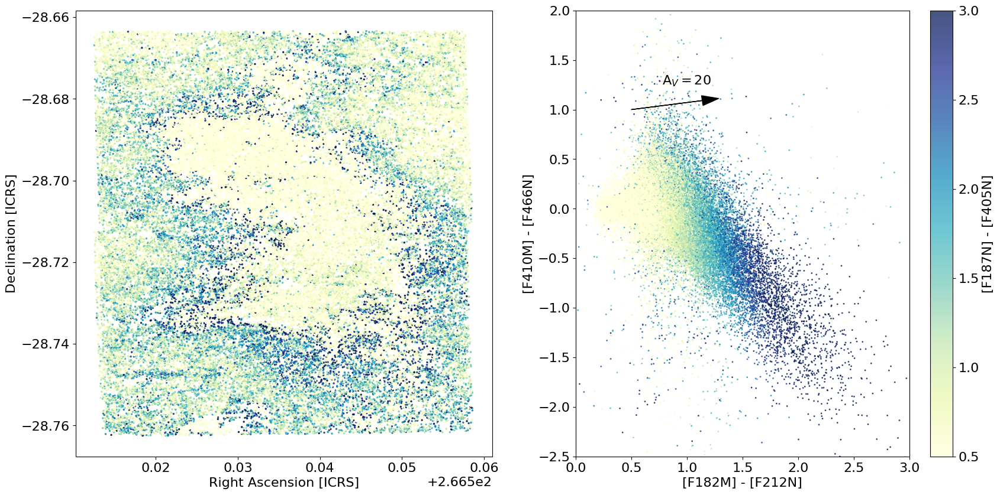

In [24]:
# Zoom OUT
co = img

pl.figure(figsize=(20,10))
ax = pl.subplot(1,2,1)
#pl.imshow(co)

crds = basetable['skycoord_f410m']
sel = basetable['sep_f405n'].quantity < 0.1*u.arcsec
sel &= (~any_saturated) & (any_good) & long_good & ~bad
xx,yy = ww410.world_to_pixel(crds[sel])

#colorby = basetable['flux_f410m']
#colorby = basetable['mag_ab_f410m'] - basetable['mag_ab_f405n']
#colorby = basetable['mag_ab_f410m'] - basetable['mag_ab_f466n']
colorby = basetable['mag_ab_f187n'] - basetable['mag_ab_f405n']

mincut = 0.5
#sel &= (colorby > mincut)

colornorm = simple_norm(colorby[sel], stretch='linear', min_cut=mincut, max_cut=3)
cmap = 'jet'
cmap = 'YlGnBu' # colorblind-friendly?

scat = ax.scatter(crds.ra[sel], crds.dec[sel], #transform=ax.get_transform('world'),
                  #edgecolor='r', facecolor='none', marker='s')#r'$\rightarrow$')
                  c=colorby[sel],
                  s=2,
                  norm=colornorm, cmap=cmap)
pl.draw()
colors = scat.get_facecolors()
scat.set_edgecolors(colors)
scat.set_facecolors('none')
ax.axis()
ax.set_xlabel("Right Ascension [ICRS]")
ax.set_ylabel("Declination [ICRS]")

ax2 = pl.subplot(1,2,2)
#ax2.scatter(basetable['mag_ab_f410m'] - basetable['mag_ab_f466n'], basetable['mag_ab_f410m'], s=2, alpha=0.05, c='k')
sc = ax2.scatter((basetable['mag_ab_f182m'] - basetable['mag_ab_f212n'])[sel],
            (basetable['mag_ab_f410m'] - basetable['mag_ab_f466n'])[sel],
            s=1, alpha=0.75,
            c=colorby[sel],
            norm=colornorm, cmap=cmap
           )
plot_extvec_ccd(ax2, ('f182m', 'f212n'), ('f410m', 'f466n'), start=(0.5,1,), color='k', extvec_scale=20, head_width=0.1)

cb = pl.colorbar(mappable=sc)
cb.set_label("[F187N] - [F405N]")
#ax2.axvline(-0.75, linestyle='--', color='r', alpha=0.5)
#ax2.axvline(-1.25, linestyle='--', color='r', alpha=0.5)
#ax2.set_ylim(pl.ylim()[::-1])
ax2.set_ylabel("[F410M] - [F466N]")
ax2.set_xlabel("[F182M] - [F212N]")
ax2.axis((0,3,-2.5,2));
ax2.text(1, 1.25, "A$_V = 20$", ha='center')
pl.savefig(f"{basepath}/paper_co/figures/ColorColorDiagram_WithSourceMap_182-212-466-c182.pdf", dpi=150, bbox_inches='tight')
pl.savefig(f"{basepath}/paper_co/figures/ColorColorDiagram_WithSourceMap_182-212-466-c182.png", dpi=150, bbox_inches='tight')
#ax2.arrow(-0.5, 0, 3, -1.5, linestyle='--')
#pl.savefig(f"{basepath}/paper_co/figures/ColorColorDiagram_WithSourceMap_182-212-466-c182_withvector.pdf", dpi=150, bbox_inches='tight')
#pl.savefig(f"{basepath}/paper_co/figures/ColorColorDiagram_WithSourceMap_182-212-466-c182_withvector.png", dpi=150, bbox_inches='tight')

In above plot: Why are the bluest sources concentrated toward the brick itself?  Detections there are most likely foreground stars.

Best explanation is that there are just _missing_ reddened sources

In [25]:
sel_result_nrcb = main(basetable_nrcb, ww=ww410_nrcb)

703 saturated in near_saturated_f212n_f212n
19 saturated in near_saturated_f466n_f466n
652 saturated in near_saturated_f405n_f405n
363 saturated in near_saturated_f187n_f187n
3503 saturated in near_saturated_f182m_f182m
7062 near saturated out of 303496.  That leaves 296434 not near unsaturated
70 saturated in replaced_saturated_f212n
8 saturated in replaced_saturated_f466n
167 saturated in replaced_saturated_f405n
35 saturated in replaced_saturated_f187n
275 saturated in replaced_saturated_f182m
618 saturated out of 303496.  That leaves 302878 unsaturated
Filter f410m has qf=82148, spread=82699, fracflux=57994 ok, totaling 57494.  There are 303496 total, of which 225231 are masked and 78265 are unmasked. qfmasksum=219803, inverse=83693.
Filter f212n has qf=181110, spread=182672, fracflux=131552 ok, totaling 131287.  There are 303496 total, of which 124658 are masked and 178838 are unmasked. qfmasksum=119821, inverse=183675.
Filter f466n has qf=65128, spread=65464, fracflux=45745 ok, t

Text(1, 1.25, 'A$_V = 20$')

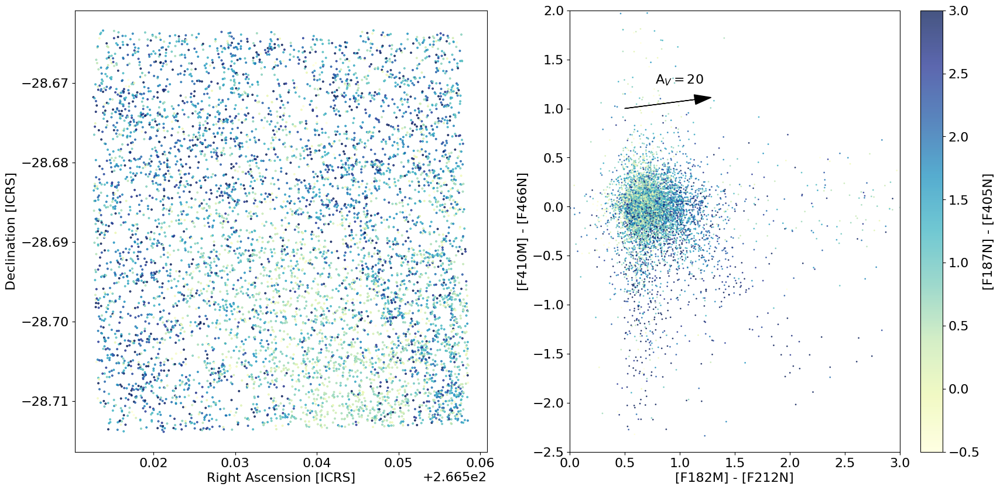

In [26]:
# do the same for nrcb
co = img

pl.figure(figsize=(20,10))
ax = pl.subplot(1,2,1)
#pl.imshow(co)

crds = basetable_nrcb['skycoord_f410m']
sel = basetable_nrcb['sep_f405n'].quantity < 0.1*u.arcsec

#sel &= (~any_saturated) & (any_good) & long_good & ~bad
sel &= (~sel_result_nrcb['any_saturated']) & (sel_result_nrcb['any_good']) & (sel_result_nrcb['long_good']) & (~sel_result_nrcb['bad'])
xx,yy = ww410.world_to_pixel(crds[sel])

#colorby = basetable_nrcb['flux_f410m']
#colorby = basetable_nrcb['mag_ab_f410m'] - basetable_nrcb['mag_ab_f405n']
#colorby = basetable_nrcb['mag_ab_f410m'] - basetable_nrcb['mag_ab_f466n']
colorby = basetable_nrcb['mag_ab_f187n'] - basetable_nrcb['mag_ab_f405n']
#sel = sel & (colorby < -2)

colornorm = simple_norm(colorby[sel], stretch='linear', min_cut=-0.5, max_cut=3)
cmap = 'jet'
cmap = 'YlGnBu' # colorblind-friendly?

scat = ax.scatter(crds.ra[sel], crds.dec[sel], #transform=ax.get_transform('world'),
                  #edgecolor='r', facecolor='none', marker='s')#r'$\rightarrow$')
                  c=colorby[sel],
                  s=3,
                  norm=colornorm, cmap=cmap)
pl.draw()
colors = scat.get_facecolors()
scat.set_edgecolors(colors)
scat.set_facecolors('none')
ax.axis()
ax.set_xlabel("Right Ascension [ICRS]")
ax.set_ylabel("Declination [ICRS]")

ax2 = pl.subplot(1,2,2)
#ax2.scatter(basetable_nrcb['mag_ab_f410m'] - basetable_nrcb['mag_ab_f466n'], basetable_nrcb['mag_ab_f410m'], s=2, alpha=0.05, c='k')
sc = ax2.scatter((basetable_nrcb['mag_ab_f182m'] - basetable_nrcb['mag_ab_f212n'])[sel],
            (basetable_nrcb['mag_ab_f410m'] - basetable_nrcb['mag_ab_f466n'])[sel],
            s=1, alpha=0.75,
            c=colorby[sel],
            norm=colornorm, cmap=cmap
           )
plot_extvec_ccd(ax2, ('f182m', 'f212n'), ('f410m', 'f466n'), start=(0.5,1,), color='k', extvec_scale=20, head_width=0.1)

cb = pl.colorbar(mappable=sc)
cb.set_label("[F187N] - [F405N]")
#ax2.axvline(-0.75, linestyle='--', color='r', alpha=0.5)
#ax2.axvline(-1.25, linestyle='--', color='r', alpha=0.5)
#ax2.set_ylim(pl.ylim()[::-1])
ax2.set_ylabel("[F410M] - [F466N]")
ax2.set_xlabel("[F182M] - [F212N]")
ax2.axis((0,3,-2.5,2));
ax2.text(1, 1.25, "A$_V = 20$", ha='center')
#pl.savefig(f"{basepath}/paper_co/figures/ColorColorDiagram_WithSourceMap_182-212-466-c182_nrcb.pdf", dpi=150, bbox_inches='tight')
#pl.savefig(f"{basepath}/paper_co/figures/ColorColorDiagram_WithSourceMap_182-212-466-c182_nrcb.png", dpi=150, bbox_inches='tight')
#ax2.arrow(-0.5, 0, 3, -1.5, linestyle='--')
#pl.savefig(f"{basepath}/paper_co/figures/ColorColorDiagram_WithSourceMap_182-212-466-c182_withvector.pdf", dpi=150, bbox_inches='tight')
#pl.savefig(f"{basepath}/paper_co/figures/ColorColorDiagram_WithSourceMap_182-212-466-c182_withvector.png", dpi=150, bbox_inches='tight')


## Paper Plot: ColorColorDiagram_WithSourceMap_182-212-410

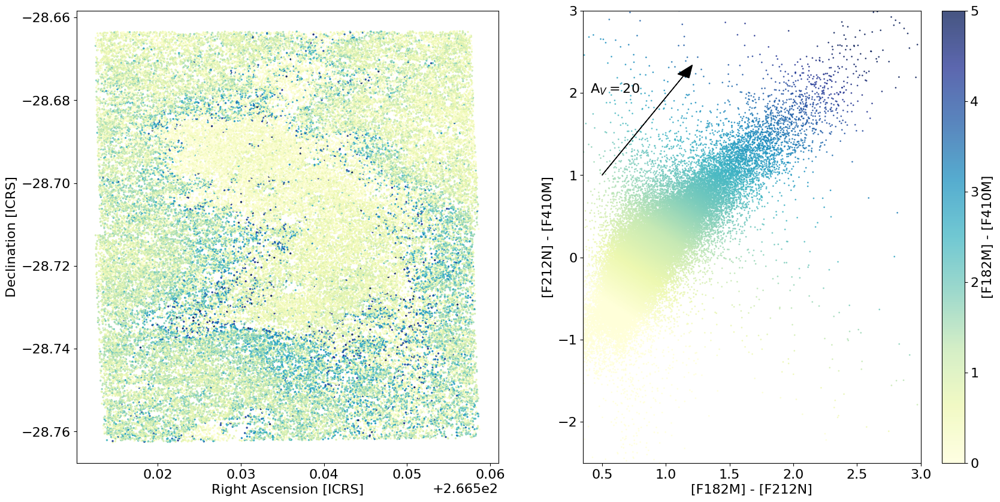

In [27]:
co = img

pl.figure(figsize=(20,10))
ax = pl.subplot(1,2,1)
#pl.imshow(co)

crds = basetable['skycoord_f410m']
sel = basetable['sep_f405n'].quantity < 0.1*u.arcsec
sel &= (~any_saturated) & (any_good) & long_good & ~bad
xx,yy = ww410.world_to_pixel(crds[sel])

#colorby = basetable['flux_f410m']
#colorby = basetable['mag_ab_f410m'] - basetable['mag_ab_f405n']
#colorby = basetable['mag_ab_f410m'] - basetable['mag_ab_f466n']
colorby = basetable['mag_ab_f182m'] - basetable['mag_ab_f410m']
#sel = sel & (colorby < -2)

colornorm = simple_norm(colorby[sel], stretch='linear', min_cut=0.0, max_cut=5)
cmap = 'YlGnBu'

scat = ax.scatter(crds.ra[sel], crds.dec[sel], #transform=ax.get_transform('world'),
                  #edgecolor='r', facecolor='none', marker='s')#r'$\rightarrow$')
                  c=colorby[sel],
                  s=2,
                  norm=colornorm, cmap=cmap)
pl.draw()
colors = scat.get_facecolors()
scat.set_edgecolors(colors)
scat.set_facecolors('none')
ax.axis()
ax.set_xlabel("Right Ascension [ICRS]")
ax.set_ylabel("Declination [ICRS]")

ax2 = pl.subplot(1,2,2)
#ax2.scatter(basetable['mag_ab_f410m'] - basetable['mag_ab_f466n'], basetable['mag_ab_f410m'], s=2, alpha=0.05, c='k')
sc = ax2.scatter((basetable['mag_ab_f182m'] - basetable['mag_ab_f212n'])[sel],
            (basetable['mag_ab_f212n'] - basetable['mag_ab_f410m'])[sel],
            s=1, alpha=0.75,
            c=colorby[sel],
            norm=colornorm, cmap=cmap
           )
plot_extvec_ccd(ax2, ('f182m', 'f212n'), ('f212n', 'f410m'), start=(0.5,1,), color='k', extvec_scale=20, head_width=0.1)

cb = pl.colorbar(mappable=sc)
cb.set_label("[F182M] - [F410M]")
#ax2.axvline(-0.75, linestyle='--', color='r', alpha=0.5)
#ax2.axvline(-1.25, linestyle='--', color='r', alpha=0.5)
#ax2.set_ylim(pl.ylim()[::-1])
ax2.set_xlabel("[F182M] - [F212N]")
ax2.set_ylabel("[F212N] - [F410M]");
ax2.axis((0.35, 3, -2.5, 3));
ax2.text(0.6, 2, "A$_V = 20$", ha='center')
pl.savefig(f"{basepath}/paper_co/figures/ColorColorDiagram_WithSourceMap_182-212-410.pdf", dpi=150, bbox_inches='tight')
pl.savefig(f"{basepath}/paper_co/figures/ColorColorDiagram_WithSourceMap_182-212-410.png", dpi=150, bbox_inches='tight')

In [42]:
import imp
imp.reload(plot_tools)
from plot_tools import plot_extvec_ccd

Found 13218 matches


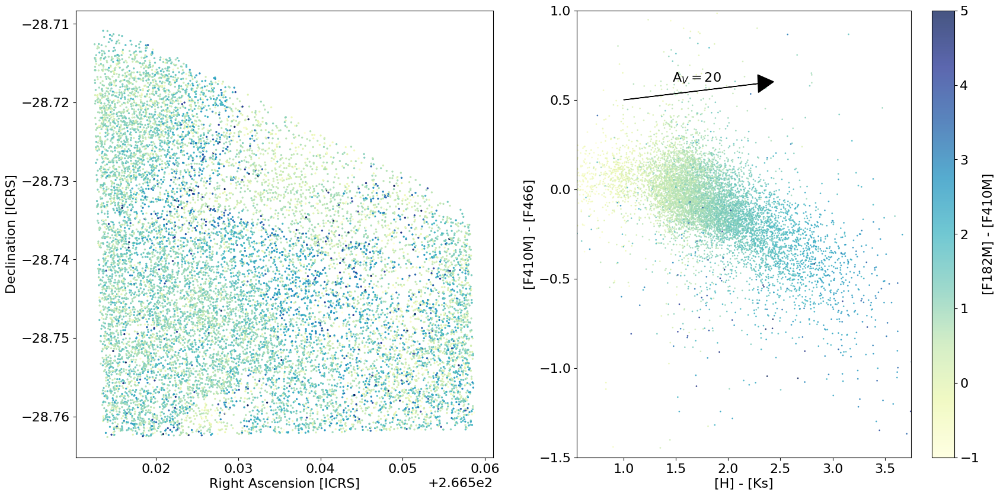

In [53]:
# GALACTICNUCLEUS version
co = img

gntable = Table.read(f'{basepath}/catalogs/GALACTICNUCLEUS_2021_merged.fits')

pl.figure(figsize=(20,10))
ax = pl.subplot(1,2,1)
#pl.imshow(co)

crds = gntable['skycoord_f410m']
sel = gntable['sep_f405n'].quantity < 0.1*u.arcsec
sel &= gntable['good_f466n']
sel &= gntable['good_f405n']
sel &= gntable['good_f410m']
sel &= gntable['good_f182m']
#sel &= (~any_saturated) & (any_good) & long_good & ~bad
xx,yy = ww410.world_to_pixel(crds[sel])
print(f"Found {sel.sum()} matches")

#colorby = gntable['flux_f410m']
#colorby = gntable['mag_ab_f410m'] - gntable['mag_ab_f405n']
#colorby = gntable['mag_ab_f410m'] - gntable['mag_ab_f466n']
colorby = gntable['mag_ab_f182m'] - gntable['mag_ab_f410m']
#sel = sel & (colorby < -2)

colornorm = simple_norm(colorby[sel], stretch='linear', min_cut=-1.0, max_cut=5)
cmap = 'YlGnBu'

scat = ax.scatter(crds.ra[sel], crds.dec[sel], #transform=ax.get_transform('world'),
                  #edgecolor='r', facecolor='none', marker='s')#r'$\rightarrow$')
                  c=colorby[sel],
                  s=2,
                  norm=colornorm, cmap=cmap)
pl.draw()
colors = scat.get_facecolors()
scat.set_edgecolors(colors)
scat.set_facecolors('none')
ax.axis()
ax.set_xlabel("Right Ascension [ICRS]")
ax.set_ylabel("Declination [ICRS]")

ax2 = pl.subplot(1,2,2)
#ax2.scatter(gntable['mag_ab_f410m'] - gntable['mag_ab_f466n'], gntable['mag_ab_f410m'], s=2, alpha=0.05, c='k')
sc = ax2.scatter((gntable['Hmag'] - gntable['Ksmag'])[sel],
            (gntable['mag_ab_f410m'] - gntable['mag_ab_f466n'])[sel],
            s=1, alpha=0.75,
            c=colorby[sel],
            norm=colornorm, cmap=cmap
           )
plot_extvec_ccd(ax2,
                ('Hmag', 'Ksmag'),
                ('f410m', 'f466n'), start=(1.0, 0.5,), color='k', extvec_scale=20, head_width=0.1)

cb = pl.colorbar(mappable=sc)
cb.set_label("[F182M] - [F410M]")
#ax2.axvline(-0.75, linestyle='--', color='r', alpha=0.5)
#ax2.axvline(-1.25, linestyle='--', color='r', alpha=0.5)
#ax2.set_ylim(pl.ylim()[::-1])
ax2.set_xlabel("[H] - [Ks]")
ax2.set_ylabel("[F410M] - [F466]");
ax2.axis((0.55, 3.75, -1.5, 1));
ax2.text(1.7, 0.6, "A$_V = 20$", ha='center')
pl.savefig(f"{basepath}/paper_co/figures/ColorColorDiagram_WithSourceMap_GN_HK_410_466.pdf", dpi=150, bbox_inches='tight')
pl.savefig(f"{basepath}/paper_co/figures/ColorColorDiagram_WithSourceMap_GN_HK_410_466.png", dpi=150, bbox_inches='tight')

# One Giant Plot to Rule them All!

Selected 33798 stars


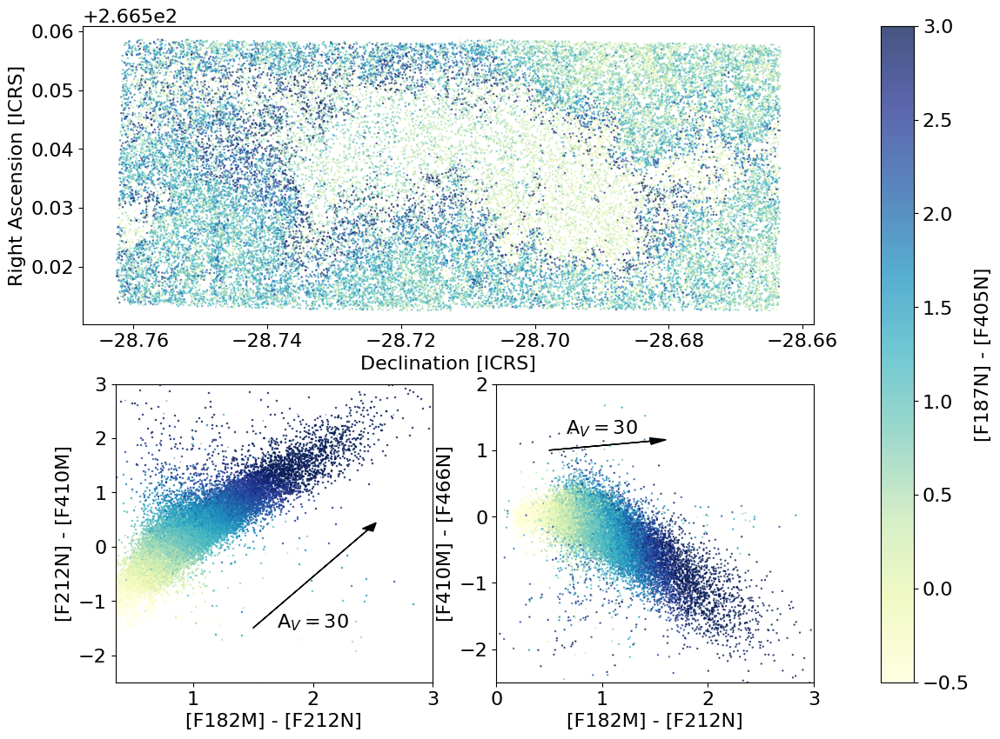

In [28]:
co = img

pl.figure(figsize=(20,10))
ax = pl.subplot(2,1,1, adjustable='box', aspect=0.88)

crds = basetable['skycoord_f410m']
sel = basetable['sep_f405n'].quantity < 0.1*u.arcsec
sel &= (~any_saturated) & (any_good) & long_good & ~bad
sel &= basetable['mag_ab_f410m'] < 18.5
xx,yy = ww410.world_to_pixel(crds[sel])

colorby = basetable['mag_ab_f187n'] - basetable['mag_ab_f405n']

colornorm = simple_norm(colorby[sel], stretch='linear', min_cut=-0.5, max_cut=3)
cmap = 'YlGnBu'

scat = ax.scatter(
                  crds.dec[sel],
                  crds.ra[sel],
                  #transform=ax.get_transform('world'),
                  #edgecolor='r', facecolor='none', marker='s')#r'$\rightarrow$')
                  c=colorby[sel],
                  s=0.5,
                  alpha=0.75,
                  norm=colornorm,
                  cmap=cmap)


#crdsb = basetable_nrcb['skycoord_f410m']
#selb = basetable_nrcb['sep_f405n'].quantity < 0.1*u.arcsec

#selb &= (~sel_result_nrcb['any_saturated']) & (sel_result_nrcb['any_good']) & (sel_result_nrcb['long_good']) & (~sel_result_nrcb['bad'])
#colorbyb = basetable_nrcb['mag_ab_f187n'] - basetable_nrcb['mag_ab_f405n']
#scat = ax.scatter(
#                  crdsb.dec[selb],
#                  crdsb.ra[selb],
#                  #transform=ax.get_transform('world'),
#                  #edgecolor='r', facecolor='none', marker='s')#r'$\rightarrow$')
#                  c=colorbyb[selb],
#                  s=0.5,
#                  norm=colornorm, cmap=cmap)



pl.draw()
colors = scat.get_facecolors()
scat.set_edgecolors(colors)
scat.set_facecolors('none')
ax.axis()
ax.set_ylabel("Right Ascension [ICRS]")
ax.set_xlabel("Declination [ICRS]")

ax2 = pl.subplot(2,3,5)
#ax2.scatter(basetable['mag_ab_f410m'] - basetable['mag_ab_f466n'], basetable['mag_ab_f410m'], s=2, alpha=0.05, c='k')
sc = ax2.scatter((basetable['mag_ab_f182m'] - basetable['mag_ab_f212n'])[sel],
                 (basetable['mag_ab_f212n'] - basetable['mag_ab_f410m'])[sel],
                 s=0.5, alpha=0.75,
                 marker=',',
                 c=colorby[sel],
                 norm=colornorm, cmap=cmap
                )
# A_V=30 roughly corresponds to 1 mag color excess in 182-212
# 1/(CT06_MWGC()(1.82*u.um) - CT06_MWGC()(2.12*u.um))
plot_extvec_ccd(ax2, ('f182m', 'f212n'), ('f212n', 'f410m'), start=(1.5,-1.5,), color='k', extvec_scale=30, head_width=0.1)
ax2.set_xlabel("[F182M] - [F212N]")
ax2.set_ylabel("[F212N] - [F410M]");
ax2.axis((0.35, 3, -2.5, 3));
ax2.text(2, -1.5, "A$_V = 30$", ha='center')


ax3 = pl.subplot(2,3,6)
sc = ax3.scatter((basetable['mag_ab_f182m'] - basetable['mag_ab_f212n'])[sel],
            (basetable['mag_ab_f410m'] - basetable['mag_ab_f466n'])[sel],
            s=0.5, alpha=0.75,
            c=colorby[sel],
            norm=colornorm, cmap=cmap
           )
#sc = ax3.scatter((basetable_nrcb['mag_ab_f182m'] - basetable_nrcb['mag_ab_f212n'])[selb],
#            (basetable_nrcb['mag_ab_f410m'] - basetable_nrcb['mag_ab_f466n'])[selb],
#            s=1, alpha=0.75,
#            c=colorbyb[selb],
#            norm=colornorm, cmap=cmap
#           )
plot_extvec_ccd(ax3, ('f182m', 'f212n'), ('f410m', 'f466n'), start=(0.5,1,), color='k', extvec_scale=30, head_width=0.1)


ax3.set_ylabel("[F410M] - [F466N]")
ax3.set_xlabel("[F182M] - [F212N]")
ax3.axis((0,3,-2.5,2));
ax3.text(1, 1.25, "A$_V = 30$", ha='center')

cb = pl.colorbar(mappable=sc, ax=pl.gcf().axes)
cb.set_label("[F187N] - [F405N]")

pl.savefig(f"{basepath}/paper_co/figures/ColorColorDiagrams_WithSourceMap_ALL.pdf", dpi=150, bbox_inches='tight')
pl.savefig(f"{basepath}/paper_co/figures/ColorColorDiagrams_WithSourceMap_ALL.png", dpi=150, bbox_inches='tight')
print(f"Selected {sel.sum()} stars")

Selected 56844 stars


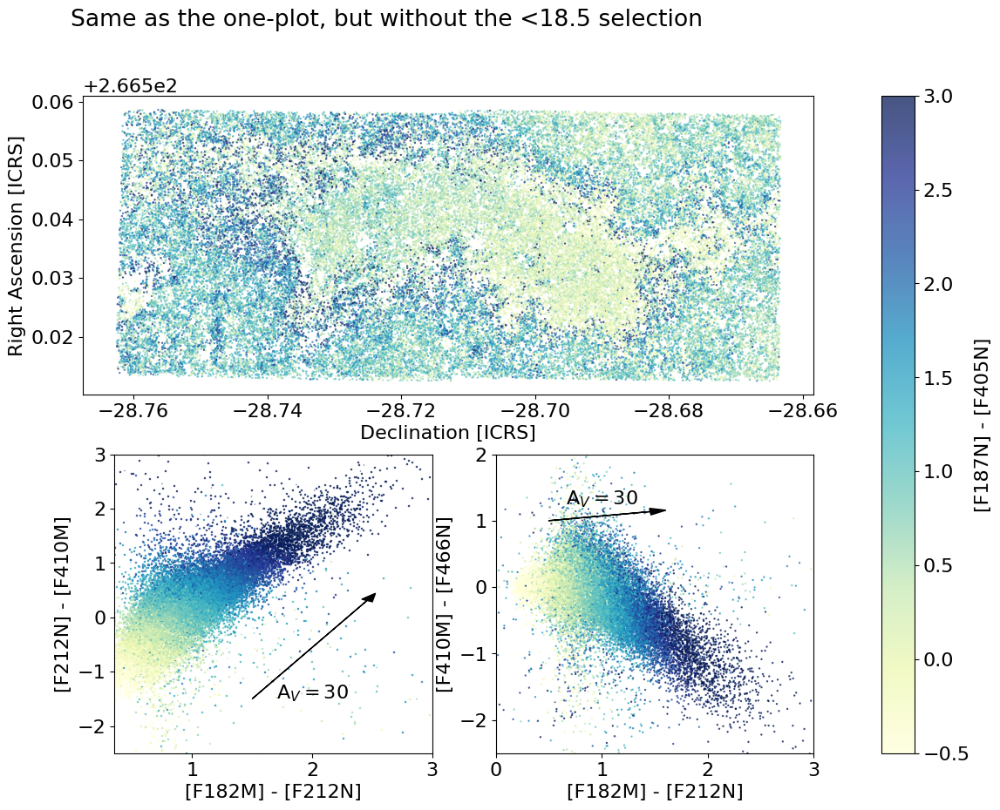

In [36]:
co = img

pl.figure(figsize=(20,10))
ax = pl.subplot(2,1,1, adjustable='box', aspect=0.88)

crds = basetable['skycoord_f410m']
sel = basetable['sep_f405n'].quantity < 0.1*u.arcsec
sel &= (~any_saturated) & (any_good) & long_good & ~bad
#sel &= basetable['mag_ab_f410m'] < 18.5
xx,yy = ww410.world_to_pixel(crds[sel])

colorby = basetable['mag_ab_f187n'] - basetable['mag_ab_f405n']

colornorm = simple_norm(colorby[sel], stretch='linear', min_cut=-0.5, max_cut=3)
cmap = 'YlGnBu'

scat = ax.scatter(
                  crds.dec[sel],
                  crds.ra[sel],
                  #transform=ax.get_transform('world'),
                  #edgecolor='r', facecolor='none', marker='s')#r'$\rightarrow$')
                  c=colorby[sel],
                  s=0.5,
                  alpha=0.75,
                  norm=colornorm,
                  cmap=cmap)


#crdsb = basetable_nrcb['skycoord_f410m']
#selb = basetable_nrcb['sep_f405n'].quantity < 0.1*u.arcsec

#selb &= (~sel_result_nrcb['any_saturated']) & (sel_result_nrcb['any_good']) & (sel_result_nrcb['long_good']) & (~sel_result_nrcb['bad'])
#colorbyb = basetable_nrcb['mag_ab_f187n'] - basetable_nrcb['mag_ab_f405n']
#scat = ax.scatter(
#                  crdsb.dec[selb],
#                  crdsb.ra[selb],
#                  #transform=ax.get_transform('world'),
#                  #edgecolor='r', facecolor='none', marker='s')#r'$\rightarrow$')
#                  c=colorbyb[selb],
#                  s=0.5,
#                  norm=colornorm, cmap=cmap)



pl.draw()
colors = scat.get_facecolors()
scat.set_edgecolors(colors)
scat.set_facecolors('none')
ax.axis()
ax.set_ylabel("Right Ascension [ICRS]")
ax.set_xlabel("Declination [ICRS]")

ax2 = pl.subplot(2,3,5)
#ax2.scatter(basetable['mag_ab_f410m'] - basetable['mag_ab_f466n'], basetable['mag_ab_f410m'], s=2, alpha=0.05, c='k')
sc = ax2.scatter((basetable['mag_ab_f182m'] - basetable['mag_ab_f212n'])[sel],
                 (basetable['mag_ab_f212n'] - basetable['mag_ab_f410m'])[sel],
                 s=0.5, alpha=0.75,
                 marker=',',
                 c=colorby[sel],
                 norm=colornorm, cmap=cmap
                )
# A_V=30 roughly corresponds to 1 mag color excess in 182-212
# 1/(CT06_MWGC()(1.82*u.um) - CT06_MWGC()(2.12*u.um))
plot_extvec_ccd(ax2, ('f182m', 'f212n'), ('f212n', 'f410m'), start=(1.5,-1.5,), color='k', extvec_scale=30, head_width=0.1)
ax2.set_xlabel("[F182M] - [F212N]")
ax2.set_ylabel("[F212N] - [F410M]");
ax2.axis((0.35, 3, -2.5, 3));
ax2.text(2, -1.5, "A$_V = 30$", ha='center')


ax3 = pl.subplot(2,3,6)
sc = ax3.scatter((basetable['mag_ab_f182m'] - basetable['mag_ab_f212n'])[sel],
            (basetable['mag_ab_f410m'] - basetable['mag_ab_f466n'])[sel],
            s=0.5, alpha=0.75,
            c=colorby[sel],
            norm=colornorm, cmap=cmap
           )
#sc = ax3.scatter((basetable_nrcb['mag_ab_f182m'] - basetable_nrcb['mag_ab_f212n'])[selb],
#            (basetable_nrcb['mag_ab_f410m'] - basetable_nrcb['mag_ab_f466n'])[selb],
#            s=1, alpha=0.75,
#            c=colorbyb[selb],
#            norm=colornorm, cmap=cmap
#           )
plot_extvec_ccd(ax3, ('f182m', 'f212n'), ('f410m', 'f466n'), start=(0.5,1,), color='k', extvec_scale=30, head_width=0.1)


ax3.set_ylabel("[F410M] - [F466N]")
ax3.set_xlabel("[F182M] - [F212N]")
ax3.axis((0,3,-2.5,2));
ax3.text(1, 1.25, "A$_V = 30$", ha='center')

cb = pl.colorbar(mappable=sc, ax=pl.gcf().axes)
cb.set_label("[F187N] - [F405N]")

pl.suptitle("Same as the one-plot, but without the <18.5 selection")

#pl.savefig(f"{basepath}/paper_co/figures/ColorColorDiagrams_WithSourceMap_ALL.pdf", dpi=150, bbox_inches='tight')
#pl.savefig(f"{basepath}/paper_co/figures/ColorColorDiagrams_WithSourceMap_ALL.png", dpi=150, bbox_inches='tight')
print(f"Selected {sel.sum()} stars")

### Diagnostic aside: Biases in star selection

Text(0.5, 1.0, 'Diagnostic plot - Why are there _more_ low-extinction stars found inside the brick?')

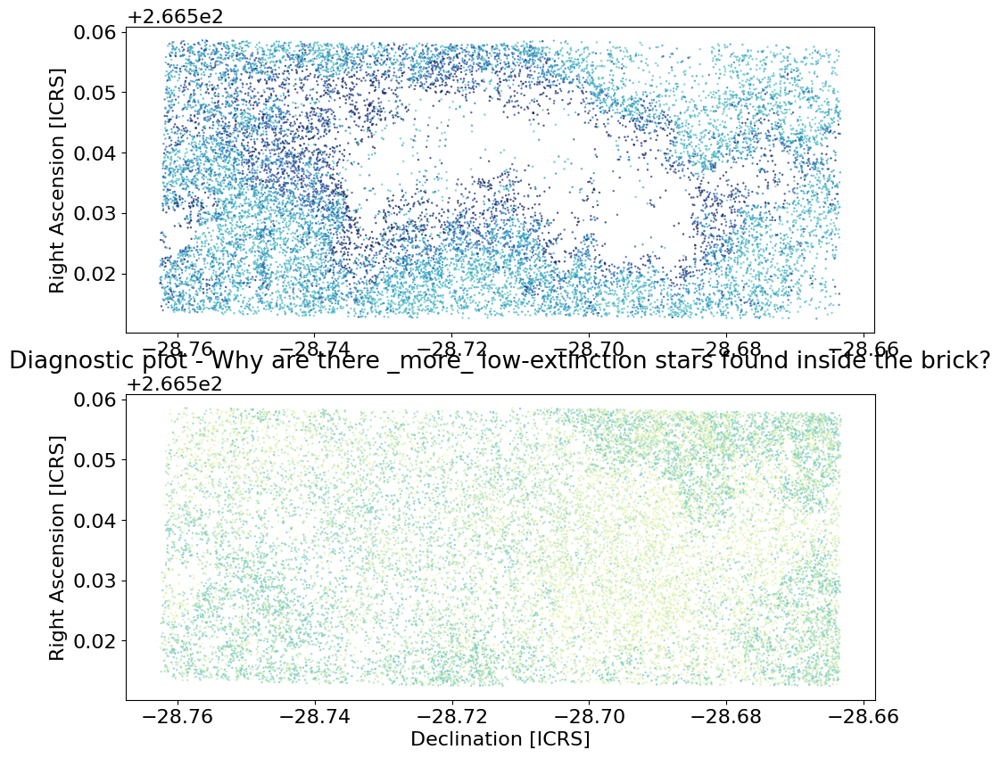

In [29]:
co = img

pl.figure(figsize=(20,10))

crds = basetable['skycoord_f410m']
sel = basetable['sep_f405n'].quantity < 0.1*u.arcsec
sel &= (~any_saturated) & (any_good) & long_good & ~bad
sel &= basetable['mag_ab_f410m'] < 18.5
xx,yy = ww410.world_to_pixel(crds[sel])

colorby = basetable['mag_ab_f187n'] - basetable['mag_ab_f405n']

colornorm = simple_norm(colorby[sel], stretch='linear', min_cut=-0.5, max_cut=3)
cmap = 'YlGnBu'

ax = pl.subplot(2,1,1, adjustable='box', aspect=0.88)
scat = ax.scatter(
                  crds.dec[sel & (colorby > 1)],
                  crds.ra[sel & (colorby > 1)],
                  #transform=ax.get_transform('world'),
                  #edgecolor='r', facecolor='none', marker='s')#r'$\rightarrow$')
                  c=colorby[sel & (colorby > 1)],
                  s=0.5,
                  alpha=0.75,
                  norm=colornorm,
                  cmap=cmap)

ax2 = pl.subplot(2,1,2, adjustable='box', aspect=0.88)
scat2 = ax2.scatter(
                  crds.dec[sel & (colorby <= 1)],
                  crds.ra[sel & (colorby <= 1)],
                  #transform=ax.get_transform('world'),
                  #edgecolor='r', facecolor='none', marker='s')#r'$\rightarrow$')
                  c=colorby[sel & (colorby <= 1)],
                  s=0.5,
                  alpha=0.75,
                  norm=colornorm,
                  cmap=cmap)


pl.draw()
colors = scat.get_facecolors()
scat.set_edgecolors(colors)
scat.set_facecolors('none')
colors2 = scat2.get_facecolors()
scat2.set_edgecolors(colors2)
scat2.set_facecolors('none')
ax.axis()
ax.set_ylabel("Right Ascension [ICRS]")
ax2.set_ylabel("Right Ascension [ICRS]")
ax2.set_xlabel("Declination [ICRS]");
pl.title("Diagnostic plot - Why are there _more_ low-extinction stars found inside the brick?")

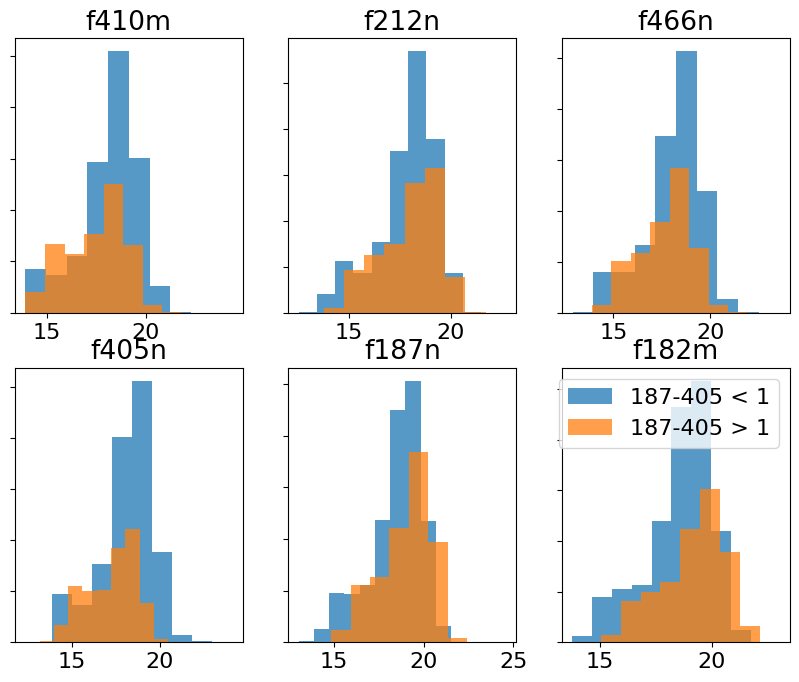

In [30]:
sel = basetable['sep_f405n'].quantity < 0.1*u.arcsec
sel &= (~any_saturated) & (any_good) & long_good & ~bad
colorby = basetable['mag_ab_f187n'] - basetable['mag_ab_f405n']
for ii, filtername in enumerate(filternames):
    ax = pl.subplot(2, 3, ii+1)
    ax.hist(basetable[f'mag_ab_{filtername}'][sel & (colorby<1)], label='187-405 < 1', alpha=0.75)
    ax.hist(basetable[f'mag_ab_{filtername}'][sel & (colorby>1)], label='187-405 > 1', alpha=0.75)
    pl.title(filtername)
    ax.set_yticklabels([])
pl.legend(loc='best')

#### Check the source density

The overall source density is relatively flat - which implies we're seeing mostly foreground stars?

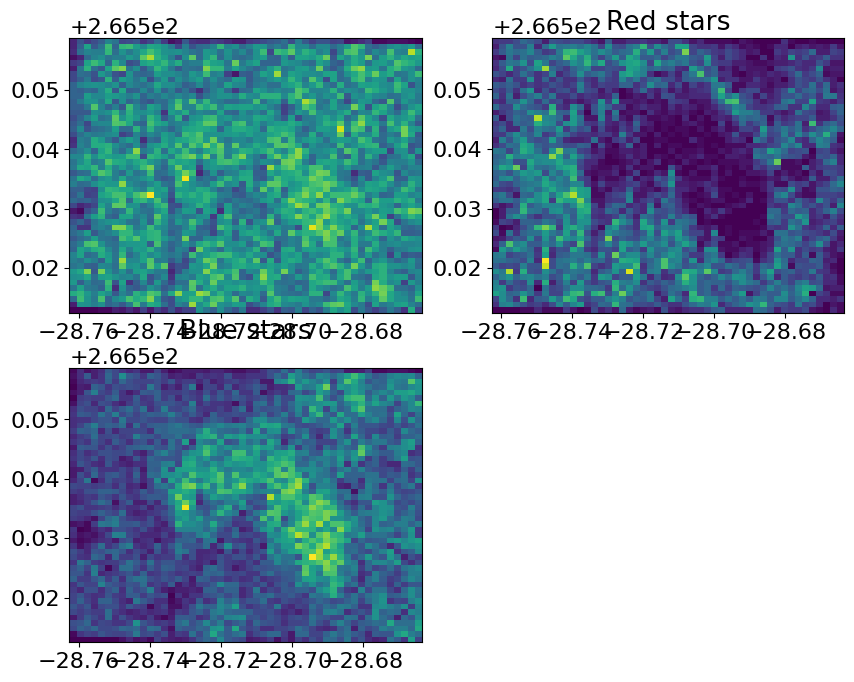

In [31]:
sel = basetable['sep_f405n'].quantity < 0.1*u.arcsec
sel &= (~any_saturated) & (any_good) & long_good & ~bad
colorby = basetable['mag_ab_f187n'] - basetable['mag_ab_f405n']
pl.subplot(2,2,1)
pl.hist2d(crds.dec[sel].value, crds.ra[sel].value, bins=(50,50));
pl.subplot(2,2,2)
pl.title("Red stars")
pl.hist2d(crds.dec[sel & (colorby>1)].value, crds.ra[sel & (colorby>1)].value, bins=(50,50));
pl.subplot(2,2,3)
pl.title("Blue stars")
pl.hist2d(crds.dec[sel & (colorby<1)].value, crds.ra[sel & (colorby<1)].value, bins=(50,50));

So what happens if we select for only brighter stars?

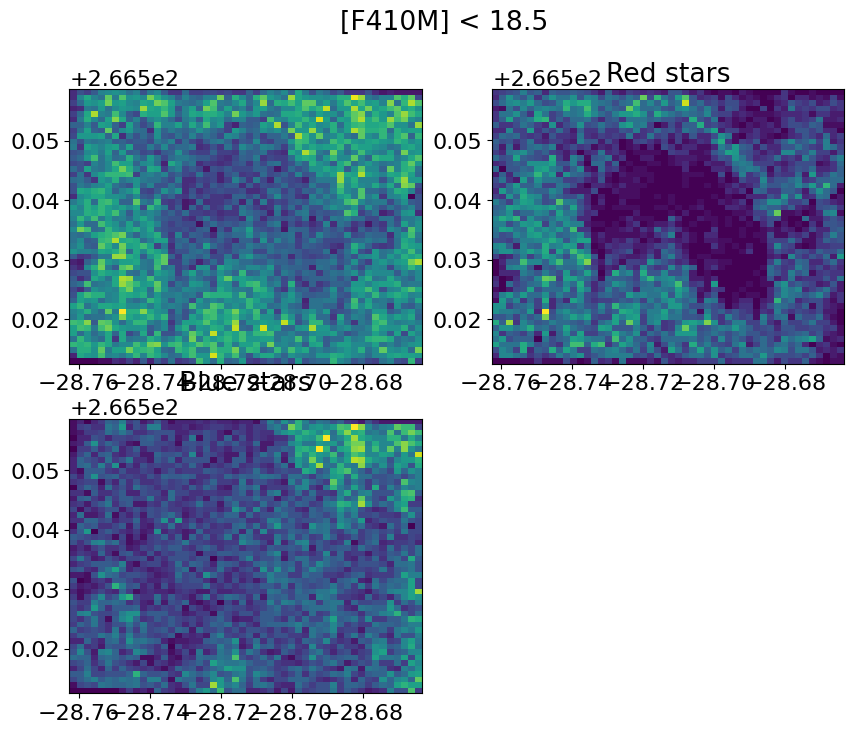

In [32]:
sel = basetable['sep_f405n'].quantity < 0.1*u.arcsec
sel &= (~any_saturated) & (any_good) & long_good & ~bad
colorby = basetable['mag_ab_f187n'] - basetable['mag_ab_f405n']
sel &= basetable['mag_ab_f410m'] < 18.5
pl.suptitle("[F410M] < 18.5")
pl.subplot(2,2,1)
pl.hist2d(crds.dec[sel].value, crds.ra[sel].value, bins=(50,50));
pl.subplot(2,2,2)
pl.title("Red stars")
pl.hist2d(crds.dec[sel & (colorby>1)].value, crds.ra[sel & (colorby>1)].value, bins=(50,50));
pl.subplot(2,2,3)
pl.title("Blue stars")
pl.hist2d(crds.dec[sel & (colorby<1)].value, crds.ra[sel & (colorby<1)].value, bins=(50,50));

Solved!  No more excess stars

What if we just ask "where are the stars" generally?

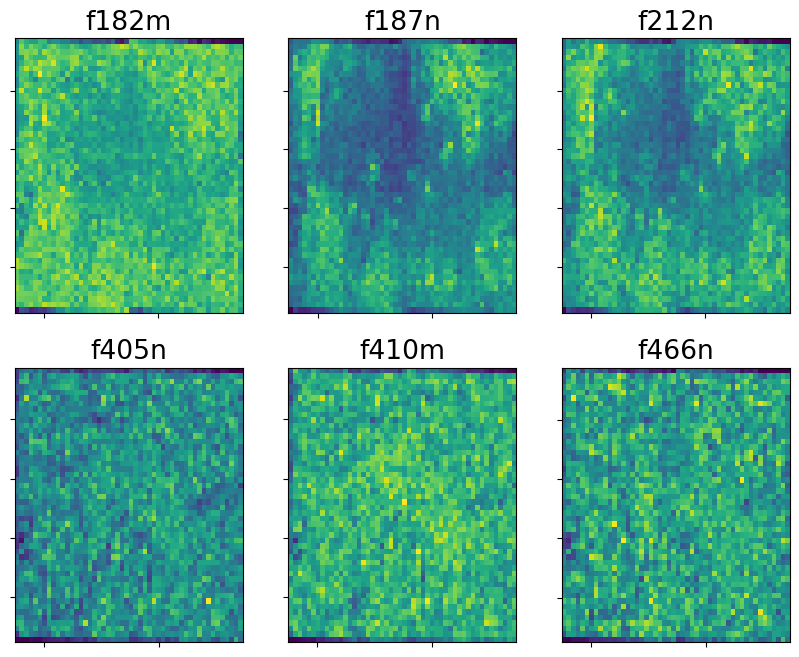

In [33]:
for ii, filtername in enumerate(sorted(filternames)):
    ax = pl.subplot(2, 3, ii+1)
    sel = basetable[f'good_{filtername}']
    pl.hist2d(crds.dec[sel].value, crds.ra[sel].value, bins=(50,50));
    pl.title(filtername)
    ax.set_yticklabels([])
    ax.set_xticklabels([])

20.763428
19.991766
19.42712
18.368088
18.551771
18.402555


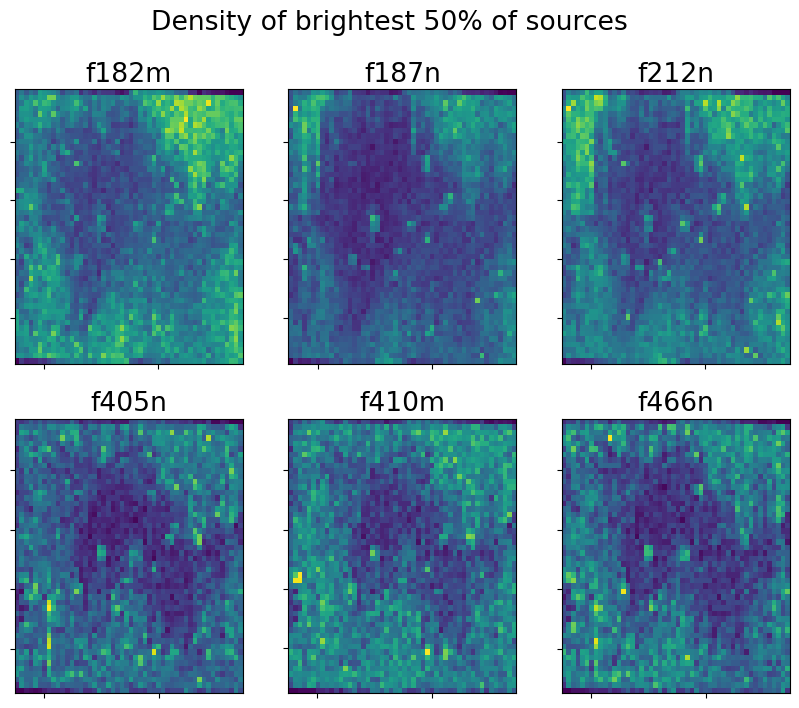

In [34]:
pl.suptitle("Density of brightest 50% of sources")
for ii, filtername in enumerate(sorted(filternames)):
    ax = pl.subplot(2, 3, ii+1)
    sel = np.array(basetable[f'good_{filtername}'], dtype='bool')
    assert any(sel)
    print(np.nanmedian(np.array(basetable[f'mag_ab_{filtername}'][sel])))
    sel &= (basetable[f'mag_ab_{filtername}'] < np.nanmedian(np.array(basetable[f'mag_ab_{filtername}'][sel])))
    pl.hist2d(crds.dec[sel].value, crds.ra[sel].value, bins=(50,50));
    pl.title(filtername)
    ax.set_yticklabels([])
    ax.set_xticklabels([])

In [35]:
sel.sum()+selb.sum()

NameError: name 'selb' is not defined

# Back to color-color plots

In [ ]:
1/(CT06_MWGC()(1.82*u.um) - CT06_MWGC()(2.12*u.um))

In [ ]:
co = img

pl.figure(figsize=(20,10))
ax = pl.subplot(1,2,1)
#pl.imshow(co)

crds = basetable['skycoord_f410m']
sel = basetable['sep_f405n'].quantity < 0.1*u.arcsec
sel &= (~any_saturated) & (any_good) & long_good & ~bad
xx,yy = ww410.world_to_pixel(crds[sel])

#colorby = basetable['flux_f410m']
#colorby = basetable['mag_ab_f410m'] - basetable['mag_ab_f405n']
#colorby = basetable['mag_ab_f410m'] - basetable['mag_ab_f466n']
colorby = basetable['mag_ab_f212n'] - basetable['mag_ab_f410m']
#sel = sel & (colorby < -2)

colornorm = simple_norm(colorby[sel], stretch='linear', min_cut=-2.0, max_cut=3.0)
cmap = 'Spectral_r'

scat = ax.scatter(crds.ra[sel], crds.dec[sel], #transform=ax.get_transform('world'),
                  #edgecolor='r', facecolor='none', marker='s')#r'$\rightarrow$')
                  c=colorby[sel],
                  s=2,
                  norm=colornorm, cmap=cmap)
pl.draw()
colors = scat.get_facecolors()
scat.set_edgecolors(colors)
scat.set_facecolors('none')
ax.axis()
ax.set_xlabel("Right Ascension [ICRS]")
ax.set_ylabel("Declination [ICRS]")

ax2 = pl.subplot(1,2,2)
#ax2.scatter(basetable['mag_ab_f410m'] - basetable['mag_ab_f466n'], basetable['mag_ab_f410m'], s=2, alpha=0.05, c='k')
sc = ax2.scatter((basetable['mag_ab_f182m'] - basetable['mag_ab_f212n'])[sel],
            (basetable['mag_ab_f182m'] - basetable['mag_ab_f410m'])[sel],
            s=1, alpha=0.75,
            c=colorby[sel],
            norm=colornorm, cmap=cmap
           )
plot_extvec_ccd(ax2, ('f182m', 'f212n'), ('f182m', 'f410m'), start=(0.5,1,), color='k', extvec_scale=20, head_width=0.1)

cb = pl.colorbar(mappable=sc)
cb.set_label("[F212N] - [F410M]")
#ax2.axvline(-0.75, linestyle='--', color='r', alpha=0.5)
#ax2.axvline(-1.25, linestyle='--', color='r', alpha=0.5)
#ax2.set_ylim(pl.ylim()[::-1])
ax2.set_xlabel("[F182M] - [F212N]")
ax2.set_ylabel("[F182M] - [F410M]");
ax2.axis((0.35, 3, -1.5, 5));
ax2.text(0.6, 2, "A$_V = 20$", ha='center')
pl.savefig(f"{basepath}/paper_co/figures/ColorColorDiagram_WithSourceMap_182-212-410b.pdf", dpi=150, bbox_inches='tight')
pl.savefig(f"{basepath}/paper_co/figures/ColorColorDiagram_WithSourceMap_182-212-410b.png", dpi=150, bbox_inches='tight')

from dust_extinction.averages import RRP89_MWGC, CT06_MWGC, F11_MWGC
from dust_extinction.parameter_averages import CCM89
from dust_extinction.shapes import G21

plot_extvec_ccd(ax2, ('f182m', 'f212n'), ('f182m', 'f410m'), start=(0.5,1,),
                color='r', extvec_scale=20, head_width=0.1, ext=F11_MWGC(),)
plot_extvec_ccd(ax2, ('f182m', 'f212n'), ('f182m', 'f410m'), start=(0.5,1,),
                color='b', extvec_scale=20, head_width=0.1, ext=RRP89_MWGC(),)
plot_extvec_ccd(ax2, ('f182m', 'f212n'), ('f182m', 'f410m'), start=(0.5,1,),
                color='g', extvec_scale=20, head_width=0.1, ext=G21(),)
pl.savefig(f"{basepath}/paper_co/figures/ColorColorDiagram_WithSourceMap_182-212-410b_compareext.pdf", dpi=150, bbox_inches='tight')
pl.savefig(f"{basepath}/paper_co/figures/ColorColorDiagram_WithSourceMap_182-212-410b_compareext.png", dpi=150, bbox_inches='tight')

In [ ]:
co = img

pl.figure(figsize=(20,10))
ax = pl.subplot(1,2,1)
#pl.imshow(co)

crds = basetable['skycoord_f410m']
sel = basetable['sep_f405n'].quantity < 0.1*u.arcsec
sel &= (~any_saturated) & (any_good) & long_good & ~bad
xx,yy = ww410.world_to_pixel(crds[sel])

#colorby = basetable['flux_f410m']
#colorby = basetable['mag_ab_f410m'] - basetable['mag_ab_f405n']
#colorby = basetable['mag_ab_f410m'] - basetable['mag_ab_f466n']
colorby = basetable['mag_ab_f212n'] - basetable['mag_ab_f410m']
#sel = sel & (colorby < -2)

colornorm = simple_norm(colorby[sel], stretch='linear', min_cut=-2.0, max_cut=3.0)
cmap = 'Spectral_r'

scat = ax.scatter(crds.ra[sel], crds.dec[sel], #transform=ax.get_transform('world'),
                  #edgecolor='r', facecolor='none', marker='s')#r'$\rightarrow$')
                  c=colorby[sel],
                  s=2,
                  norm=colornorm, cmap=cmap)
pl.draw()
colors = scat.get_facecolors()
scat.set_edgecolors(colors)
scat.set_facecolors('none')
ax.axis()
ax.set_xlabel("Right Ascension [ICRS]")
ax.set_ylabel("Declination [ICRS]")

ax2 = pl.subplot(1,2,2)
#ax2.scatter(basetable['mag_ab_f410m'] - basetable['mag_ab_f466n'], basetable['mag_ab_f410m'], s=2, alpha=0.05, c='k')
sc = ax2.scatter((basetable['mag_ab_f182m'] - basetable['mag_ab_f410m'])[sel],
            (basetable['mag_ab_f187n'] - basetable['mag_ab_f405n'])[sel],
            s=1, alpha=0.75,
            c=colorby[sel],
            norm=colornorm, cmap=cmap
           )
plot_extvec_ccd(ax2, ('f182m', 'f410m'), ('f187n', 'f405n'), start=(0.5,1,), color='k', extvec_scale=20, head_width=0.1)

cb = pl.colorbar(mappable=sc)
cb.set_label("[F212N] - [F410M]")
#ax2.axvline(-0.75, linestyle='--', color='r', alpha=0.5)
#ax2.axvline(-1.25, linestyle='--', color='r', alpha=0.5)
#ax2.set_ylim(pl.ylim()[::-1])
ax2.set_ylabel("[F187N] - [F405N]")
ax2.set_xlabel("[F182M] - [F410M]");
ax2.axis((-1.5, 5.5, -1.5, 5.5));
ax2.text(0.6, 2, "A$_V = 20$", ha='center')
pl.savefig(f"{basepath}/paper_co/figures/ColorColorDiagram_WithSourceMap_187-405v182-410.pdf", dpi=150, bbox_inches='tight')
pl.savefig(f"{basepath}/paper_co/figures/ColorColorDiagram_WithSourceMap_187-405v182-410.png", dpi=150, bbox_inches='tight')

from dust_extinction.averages import RRP89_MWGC, CT06_MWGC, F11_MWGC
from dust_extinction.parameter_averages import CCM89
from dust_extinction.shapes import G21



plot_extvec_ccd(ax2, ('f182m', 'f410m'), ('f187n', 'f405n'), start=(0.5,1,),
                color='r', extvec_scale=20, head_width=0.1, ext=F11_MWGC(),)
plot_extvec_ccd(ax2, ('f182m', 'f410m'), ('f187n', 'f405n'), start=(0.5,1,),
                color='b', extvec_scale=20, head_width=0.1, ext=RRP89_MWGC(),)
plot_extvec_ccd(ax2, ('f182m', 'f410m'), ('f187n', 'f405n'), start=(0.5,1,),
                color='g', extvec_scale=20, head_width=0.1, ext=G21(),)
pl.savefig(f"{basepath}/paper_co/figures/ColorColorDiagram_WithSourceMap_187-405v182-410_compareext.pdf", dpi=150, bbox_inches='tight')
pl.savefig(f"{basepath}/paper_co/figures/ColorColorDiagram_WithSourceMap_187-405v182-410_compareext.png", dpi=150, bbox_inches='tight')

In [ ]:
co = img

pl.figure(figsize=(20,10))
ax = pl.subplot(1,2,1, projection=wwi)
pl.imshow(co)

crds = basetable['skycoord_f410m']
sel = basetable['sep_f405n'].quantity < 0.1*u.arcsec
sel &= long_good & ~any_saturated
xx,yy = ww410.world_to_pixel(crds[sel])

#colorby = basetable['flux_f410m']
colorby = basetable['mag_ab_f212n'] - basetable['mag_ab_f410m']
#sel = sel & (colorby < -2)

colornorm = simple_norm(colorby[sel], stretch='asinh', min_cut=-1.5, max_cut=3)

scat = ax.scatter(crds.ra[sel], crds.dec[sel], transform=ax.get_transform('world'),
                  #edgecolor='r', facecolor='none', marker='s')#r'$\rightarrow$')
                  c=colorby[sel],
                  s=1,
                  norm=colornorm, cmap='jet')
pl.draw()
colors = scat.get_facecolors()
scat.set_edgecolors(colors)
scat.set_facecolors('none')
ax.axis()

ax2 = pl.subplot(1,2,2)
#ax2.scatter(basetable['mag_ab_f410m'] - basetable['mag_ab_f466n'], basetable['mag_ab_f410m'], s=2, alpha=0.05, c='k')
sc = ax2.scatter((basetable['mag_ab_f187n'] - basetable['mag_ab_f182m'])[sel],
            (basetable['mag_ab_f405n'] - basetable['mag_ab_f410m'])[sel],
            s=10, alpha=0.5,
            c=colorby[sel],
            norm=colornorm, cmap='jet'
           )

cb = pl.colorbar(mappable=sc)
cb.set_label("[F212N] - [F410M]")
#ax2.axvline(-0.75, linestyle='--', color='r', alpha=0.5)
#ax2.axvline(-1.25, linestyle='--', color='r', alpha=0.5)
#ax2.set_ylim(pl.ylim()[::-1])
ax2.set_ylabel("[F405N] - [F410M]")
ax2.set_xlabel("[F187N] - [F182M]");
ax2.axis((-0.35,0.05,-0.15,0.3));
pl.suptitle("Recombination Line Excess plots");

In [ ]:
10**(0.1/2.512), 10**(-0.15/2.512)

In [ ]:
# look for H-alpha excess stars (187n-182m negative, 405n-410m negative)
co = img

pl.figure(figsize=(20,10))
ax = pl.subplot(1,2,1, projection=wwi)
pl.imshow(co)

crds = basetable['skycoord_f410m']
sel = basetable['sep_f405n'].quantity < 0.1*u.arcsec
sel &= long_good & ~any_saturated
sel &= (basetable['mag_ab_f187n'] - basetable['mag_ab_f182m']) < -0.15
sel &= (basetable['mag_ab_f405n'] - basetable['mag_ab_f410m']) < 0.1
xx,yy = ww410.world_to_pixel(crds[sel])

#colorby = basetable['flux_f410m']
colorby = basetable['mag_ab_f212n'] - basetable['mag_ab_f410m']
#sel = sel & (colorby < -2)

colornorm = simple_norm(colorby[sel], stretch='asinh', min_cut=-1.5, max_cut=3)

scat = ax.scatter(crds.ra[sel], crds.dec[sel], transform=ax.get_transform('world'),
                  #edgecolor='r', facecolor='none', marker='s')#r'$\rightarrow$')
                  c=colorby[sel],
                  s=1,
                  norm=colornorm, cmap='jet')
pl.draw()
colors = scat.get_facecolors()
scat.set_edgecolors(colors)
scat.set_facecolors('none')
ax.axis()

ax2 = pl.subplot(1,2,2)
#ax2.scatter(basetable['mag_ab_f410m'] - basetable['mag_ab_f466n'], basetable['mag_ab_f410m'], s=2, alpha=0.05, c='k')
sc = ax2.scatter((basetable['mag_ab_f187n'] - basetable['mag_ab_f182m'])[sel],
            (basetable['mag_ab_f405n'] - basetable['mag_ab_f410m'])[sel],
            s=10, alpha=0.5,
            c=colorby[sel],
            norm=colornorm, cmap='jet'
           )

cb = pl.colorbar(mappable=sc)
cb.set_label("[F212N] - [F410M]")
#ax2.axvline(-0.75, linestyle='--', color='r', alpha=0.5)
#ax2.axvline(-1.25, linestyle='--', color='r', alpha=0.5)
#ax2.set_ylim(pl.ylim()[::-1])
ax2.set_ylabel("[F405N] - [F410M]")
ax2.set_xlabel("[F187N] - [F182M]");
ax2.axis((-0.55,-0.15,-0.25,0.1));
pl.suptitle("RL excesses: 405/410>1.1, 187/182>0.87");

In [ ]:
# where are the low-extinction sources?
# answer: selectively toward the brick
co = img

pl.figure(figsize=(20,10))
ax = pl.subplot(1,2,1, projection=wwi)
pl.imshow(co)

crds = basetable['skycoord_f410m']
sel = basetable['sep_f405n'].quantity < 0.1*u.arcsec
sel &= long_good & ~any_saturated
sel &= basetable['mag_ab_f212n'] - basetable['mag_ab_f410m'] < 0 # extinction cut: low extinction
xx,yy = ww410.world_to_pixel(crds[sel])

#colorby = basetable['flux_f410m']
colorby = basetable['mag_ab_f212n'] - basetable['mag_ab_f410m']
#sel = sel & (colorby < -2)

colornorm = simple_norm(colorby[sel], stretch='asinh', min_cut=-1.5, max_cut=3)

scat = ax.scatter(crds.ra[sel], crds.dec[sel], transform=ax.get_transform('world'),
                  #edgecolor='r', facecolor='none', marker='s')#r'$\rightarrow$')
                  c=colorby[sel],
                  s=1,
                  norm=colornorm, cmap='jet')
pl.draw()
colors = scat.get_facecolors()
scat.set_edgecolors(colors)
scat.set_facecolors('none')
ax.axis()

ax2 = pl.subplot(1,2,2)
#ax2.scatter(basetable['mag_ab_f410m'] - basetable['mag_ab_f466n'], basetable['mag_ab_f410m'], s=2, alpha=0.05, c='k')
sc = ax2.scatter((basetable['mag_ab_f187n'] - basetable['mag_ab_f182m'])[sel],
            (basetable['mag_ab_f405n'] - basetable['mag_ab_f410m'])[sel],
            s=10, alpha=0.5,
            c=colorby[sel],
            norm=colornorm, cmap='jet'
           )

cb = pl.colorbar(mappable=sc)
cb.set_label("[F212N] - [F410M]")
#ax2.axvline(-0.75, linestyle='--', color='r', alpha=0.5)
#ax2.axvline(-1.25, linestyle='--', color='r', alpha=0.5)
#ax2.set_ylim(pl.ylim()[::-1])
ax2.set_ylabel("[F405N] - [F410M]")
ax2.set_xlabel("[F187N] - [F182M]");
ax2.axis((-0.35,0.05,-0.15,0.3));
pl.suptitle("RL Excess: Low Extinction sources")

In [ ]:
# where are the high-extinction sources?
# selectively around the edge of the brick
co = img

pl.figure(figsize=(20,10))
ax = pl.subplot(1,2,1, projection=wwi)
pl.imshow(co)

crds = basetable['skycoord_f410m']
sel = basetable['sep_f405n'].quantity < 0.1*u.arcsec
sel &= long_good & ~any_saturated
sel &= basetable['mag_ab_f212n'] - basetable['mag_ab_f410m'] > 0 # extinction cut: high extinction
xx,yy = ww410.world_to_pixel(crds[sel])

#colorby = basetable['flux_f410m']
colorby = basetable['mag_ab_f212n'] - basetable['mag_ab_f410m']
#sel = sel & (colorby < -2)

colornorm = simple_norm(colorby[sel], stretch='asinh', min_cut=-1.5, max_cut=3)

scat = ax.scatter(crds.ra[sel], crds.dec[sel], transform=ax.get_transform('world'),
                  #edgecolor='r', facecolor='none', marker='s')#r'$\rightarrow$')
                  c=colorby[sel],
                  s=1,
                  norm=colornorm, cmap='jet')
pl.draw()
colors = scat.get_facecolors()
scat.set_edgecolors(colors)
scat.set_facecolors('none')
ax.axis()

ax2 = pl.subplot(1,2,2)
#ax2.scatter(basetable['mag_ab_f410m'] - basetable['mag_ab_f466n'], basetable['mag_ab_f410m'], s=2, alpha=0.05, c='k')
sc = ax2.scatter((basetable['mag_ab_f187n'] - basetable['mag_ab_f182m'])[sel],
            (basetable['mag_ab_f405n'] - basetable['mag_ab_f410m'])[sel],
            s=10, alpha=0.5,
            c=colorby[sel],
            norm=colornorm, cmap='jet'
           )

cb = pl.colorbar(mappable=sc)
cb.set_label("[F212N] - [F410M]")
#ax2.axvline(-0.75, linestyle='--', color='r', alpha=0.5)
#ax2.axvline(-1.25, linestyle='--', color='r', alpha=0.5)
#ax2.set_ylim(pl.ylim()[::-1])
ax2.set_ylabel("[F405N] - [F410M]")
ax2.set_xlabel("[F187N] - [F182M]");
ax2.axis((-0.35,0.05,-0.15,0.3));
pl.suptitle("RL Excess: High Extinction")

In [ ]:
# where are the high-extinction sources?
# selectively around the edge of the brick
# but what about for LONG only?
co = img

pl.figure(figsize=(20,10))
ax = pl.subplot(1,2,1)#, projection=wwi)
#pl.imshow(co)

crds = basetable['skycoord_f410m']
sel = basetable['sep_f466n'].quantity < 0.1*u.arcsec
sel &= long_good & ~any_saturated
#sel &= basetable['mag_ab_f212n'] - basetable['mag_ab_f410m'] > 0 # extinction cut: high extinction
xx,yy = ww410.world_to_pixel(crds[sel])

#colorby = basetable['flux_f410m']
colorby = basetable['mag_ab_f410m'] - basetable['mag_ab_f466n']
#sel = sel & (colorby < -2)

colornorm = simple_norm(colorby[sel], stretch='linear', min_cut=-1.0, max_cut=1.0)
cmap = 'Spectral_r'

scat = ax.scatter(crds.ra[sel], crds.dec[sel], #transform=ax.get_transform('world'),
                  #edgecolor='r', facecolor='none', marker='s')#r'$\rightarrow$')
                  c=colorby[sel],
                  s=1,
                  norm=colornorm, cmap=cmap)
pl.draw()
colors = scat.get_facecolors()
scat.set_edgecolors(colors)
scat.set_facecolors('none')
ax.axis()

ax.set_xlabel("Right Ascension [ICRS]")
ax.set_ylabel("Declination [ICRS]")



ax2 = pl.subplot(1,2,2)
#ax2.scatter(basetable['mag_ab_f410m'] - basetable['mag_ab_f466n'], basetable['mag_ab_f410m'], s=2, alpha=0.05, c='k')
sc = ax2.scatter((basetable['mag_ab_f410m'] - basetable['mag_ab_f466n'])[sel],
                 basetable['mag_ab_f466n'][sel],
            s=10, alpha=0.5,
            c=colorby[sel],
            norm=colornorm, cmap=cmap
           )

cb = pl.colorbar(mappable=sc)
cb.set_label("[F410M] - [F466N]")
ax2.set_xlabel("[F410M] - [F466N]")
ax2.set_ylabel("[F466N]")

ax2.axis((-1.5, 0.7, 22, 13.5));
pl.suptitle("Long-only CMD");

In [ ]:
# where are the high-extinction sources?
# selectively around the edge of the brick
# but what about for LONG only?
co = img

pl.figure(figsize=(20,10))
ax = pl.subplot(1,2,1)#, projection=wwi)
#pl.imshow(co)

crds = basetable['skycoord_f410m']
sel = basetable['sep_f466n'].quantity < 0.1*u.arcsec
sel &= long_good & ~any_saturated
#sel &= basetable['mag_ab_f212n'] - basetable['mag_ab_410m405'] > 0 # extinction cut: high extinction
xx,yy = ww410.world_to_pixel(crds[sel])

#colorby = basetable['flux_f410m']
colorby = basetable['mag_ab_410m405'] - basetable['mag_ab_f466n']
#sel = sel & (colorby < -2)

colornorm = simple_norm(colorby[sel], stretch='asinh', min_cut=-0.75, max_cut=0.75)

scat = ax.scatter(crds.ra[sel], crds.dec[sel], #transform=ax.get_transform('world'),
                  #edgecolor='r', facecolor='none', marker='s')#r'$\rightarrow$')
                  c=colorby[sel],
                  s=1,
                  norm=colornorm, cmap='jet')
pl.draw()
colors = scat.get_facecolors()
scat.set_edgecolors(colors)
scat.set_facecolors('none')
ax.axis()

ax.set_xlabel("Right Ascension [ICRS]")
ax.set_ylabel("Declination [ICRS]")



ax2 = pl.subplot(1,2,2)
#ax2.scatter(basetable['mag_ab_410m405'] - basetable['mag_ab_f466n'], basetable['mag_ab_f410m'], s=2, alpha=0.05, c='k')
sc = ax2.scatter((basetable['mag_ab_410m405'] - basetable['mag_ab_f466n'])[sel],
                 basetable['mag_ab_f466n'][sel],
            s=10, alpha=0.5,
            c=colorby[sel],
            norm=colornorm, cmap='jet'
           )

cb = pl.colorbar(mappable=sc)
cb.set_label("[F410M-F405N] - [F466N]")
ax2.set_xlabel("[F410M-F405N] - [F466N]")
ax2.set_ylabel("[F466N]")

ax2.axis((-1.5, 0.7, 22, 13.5));
pl.suptitle("Long-only CMD");

In [ ]:
co = img

pl.figure(figsize=(20,10))
ax = pl.subplot(1,2,1)

crds = basetable['skycoord_f410m']
sel = basetable['sep_f466n'].quantity < 0.1*u.arcsec
sel &= long_good & ~any_saturated
#sel &= basetable['mag_ab_f212n'] - basetable['mag_ab_410m405'] > 0 # extinction cut: high extinction
xx,yy = ww410.world_to_pixel(crds[sel])

#colorby = basetable['flux_f410m']
colorby = basetable['mag_ab_410m405'] - basetable['mag_ab_405m410']
#sel = sel & (colorby < -2)

colornorm = simple_norm(colorby[sel], stretch='asinh', min_cut=-5.0, max_cut=1)

scat = ax.scatter(crds.ra[sel], crds.dec[sel], #transform=ax.get_transform('world'),
                  #edgecolor='r', facecolor='none', marker='s')#r'$\rightarrow$')
                  c=colorby[sel],
                  s=1,
                  norm=colornorm, cmap='jet')
pl.draw()
colors = scat.get_facecolors()
scat.set_edgecolors(colors)
scat.set_facecolors('none')
ax.axis()

ax.set_xlabel("Right Ascension [ICRS]")
ax.set_ylabel("Declination [ICRS]")



ax2 = pl.subplot(1,2,2)
#ax2.scatter(basetable['mag_ab_410m405'] - basetable['mag_ab_f466n'], basetable['mag_ab_f410m'], s=2, alpha=0.05, c='k')
sc = ax2.scatter((basetable['mag_ab_410m405'] - basetable['mag_ab_f466n'])[sel],
                 (basetable['mag_ab_405m410'] - basetable['mag_ab_f466n'])[sel],
            s=10, alpha=0.5,
            c=colorby[sel],
            norm=colornorm, cmap='jet'
           )

cb = pl.colorbar(mappable=sc)
cb.set_label("[F410M-F405N] - [F405N-F410M]")
ax2.set_xlabel("[F410M-F405N] - [F466N]")
ax2.set_ylabel("[F405N-F410M] - [F466N]")

ax2.axis((-1.5, 0.7, -1.5, 5));
pl.suptitle("Long-only CCD");

# GOAL: Plot 466 absorption vs A_V

1. estimate A_V as f212n-f410m / ext(f212n-f410m)

2. estimate f466n column: want N(CO) / F466N-F410M so we can multiply by F466N-F410M color.  Seems not to be linear, though.

In [ ]:
import icemodels
import imp
imp.reload(icemodels)
from icemodels import absorbed_spectrum, absorbed_spectrum_Gaussians, convsum, fluxes_in_filters, load_molecule, atmo_model, molecule_data

In [ ]:
from astroquery.svo_fps import SvoFps
from astropy import table
filter_data = SvoFps.get_filter_list('JWST', instrument="NIRCam")
filter_data.add_index('filterID')
flxd = filter_data['filterID'] # TODO: might need to change this to only select the filters we're using below
#filter_wavelengths = [filter_data.loc[filterid]['WavelengthCen'] for filterid in flxd]
#filter_widths = [filter_data.loc[filterid]['WidthEff'] for filterid in flxd]
#filter_wlmin = [filter_data.loc[filterid]['WavelengthMin'] for filterid in flxd]
#filter_wlmax = [filter_data.loc[filterid]['WavelengthMax'] for filterid in flxd]

In [ ]:
filterid = 'JWST/NIRCam.F466N'
xarr = np.linspace(filter_data.loc[filterid]['WavelengthMin'] * u.AA,
                   filter_data.loc[filterid]['WavelengthMax'] * u.AA,
                   1000)
xarr = np.linspace(3.95*u.um, 4.8*u.um, 5000)
phx4000 = atmo_model(4000, xarr=xarr)

aspec = absorbed_spectrum(1e18*u.cm**-2, load_molecule('co'), spectrum=phx4000['fnu'], xarr=xarr)
pl.plot(xarr.to(u.um), aspec / aspec.max())

trans = SvoFps.get_transmission_data(filterid)
pl.plot(trans['Wavelength'].quantity.to(u.um),
        trans['Transmission'].value/trans['Transmission'].value.max() + 1,
        linewidth=0.5,
        color='orange')

In [ ]:
import icemodels
import imp
imp.reload(icemodels.core)
imp.reload(icemodels)
from icemodels import absorbed_spectrum, absorbed_spectrum_Gaussians, convsum, fluxes_in_filters, load_molecule, load_molecule_ocdb, atmo_model, molecule_data

In [ ]:
molecule = 'co'
consts = load_molecule_ocdb(molecule)
xarr = phx4000['nu'].quantity.to(u.um, u.spectral())
cols = np.geomspace(1e15, 1e22, 25)
dmags410 = []
dmags466 = []

print(f"  column,   mag410,  mag410*,  mag466n, mag466n*, dmag410, dmag466")
for col in cols:
    spec = absorbed_spectrum(col*u.cm**-2, consts, molecular_weight=molecule_data[molecule]['molwt'],
                              spectrum=phx4000['fnu'].quantity,
                              xarr=xarr,
                             )
    cmd_x = ('JWST/NIRCam.F410M', 'JWST/NIRCam.F466N')
    flxd_ref = fluxes_in_filters(xarr, phx4000['fnu'].quantity)
    flxd = fluxes_in_filters(xarr, spec)
    mags_x_star = flxd_ref[cmd_x[0]].to(u.ABmag).value, flxd_ref[cmd_x[1]].to(u.ABmag).value
    mags_x = flxd[cmd_x[0]].to(u.ABmag).value, flxd[cmd_x[1]].to(u.ABmag).value
    dmags466.append(mags_x[1]-mags_x_star[1])
    dmags410.append(mags_x[0]-mags_x_star[0])
    # why would f410m change at all?
    print(f"{col:8.1g}, {mags_x[0]:8.1f}, {mags_x_star[0]:8.1f}, {mags_x[1]:8.1f}, {mags_x_star[1]:8.1f}, {dmags410[-1]:8.1f}, {dmags466[-1]:8.1f}")

# Pontoppidan ice models

In [ ]:
# apolar in CO2, apolar pure CO, polar methanol ice
# co_ice_wls_icm = ([2143.7, 2139.9, 2136.5] * u.cm**-1)
# co_ice_wls = co_ice_wls_icm.to(u.um, u.spectral())
# co_ice_widths = (([3.0, 3.5, 10.6] * u.cm**-1)/co_ice_wls_icm * co_ice_wls).to(u.um, u.spectral())
# co_ice_bandstrength = 1.1e-17 * u.cm # cm per molecule; Jian+1975 via Boogert+2022
from icemodels.gaussian_model_components import co_ice_wls_icm, co_ice_wls, co_ice_widths, co_ice_bandstrength
co_ice_wls, co_ice_widths

In [ ]:
# debug to understand why F410M experiences CO extinction
pl.plot(xarr, phx4000['fnu'].quantity)
col = 1e18
molecule = 'co'
consts = load_molecule_ocdb('co')
spec = absorbed_spectrum(col*u.cm**-2, consts, molecular_weight=molecule_data[molecule]['molwt'],
                          spectrum=phx4000['fnu'].quantity,
                          xarr=xarr,
                         )
pl.plot(xarr, spec, label='CO N=10$^{18}$ (Hudgins)')
spec = absorbed_spectrum_Gaussians(col*u.cm**-2, co_ice_wls, co_ice_widths, [co_ice_bandstrength]*3,
                          spectrum=phx4000['fnu'].quantity,
                          xarr=xarr,
                         )
pl.plot(xarr, spec, label='CO N=10$^{18}$ (Gaussian)')

col = 1e19
spec = absorbed_spectrum(col*u.cm**-2, consts, molecular_weight=molecule_data[molecule]['molwt'],
                          spectrum=phx4000['fnu'].quantity,
                          xarr=xarr,
                         )
pl.plot(xarr, spec, label='CO N=10$^{19}$ (Hudgins)')
spec = absorbed_spectrum_Gaussians(col*u.cm**-2, co_ice_wls, co_ice_widths, [co_ice_bandstrength]*3,
                          spectrum=phx4000['fnu'].quantity,
                          xarr=xarr,
                         )
pl.plot(xarr, spec, label='CO N=10$^{19}$ (Gaussian)')

col = 1e20
spec = absorbed_spectrum(col*u.cm**-2, consts, molecular_weight=molecule_data[molecule]['molwt'],
                          spectrum=phx4000['fnu'].quantity,
                          xarr=xarr,
                         )
pl.plot(xarr, spec, label='CO N=10$^{20}$ (Hudgins)')
spec = absorbed_spectrum_Gaussians(col*u.cm**-2, co_ice_wls, co_ice_widths, [co_ice_bandstrength]*3,
                          spectrum=phx4000['fnu'].quantity,
                          xarr=xarr,
                         )
pl.plot(xarr, spec, label='CO N=10$^{20}$ (Gaussian)')
pl.legend(loc='upper right', fontsize=12)
pl.xlim(4.5, 4.85)

In [ ]:
import icemodels
import imp
imp.reload(icemodels.core)
imp.reload(icemodels)
from icemodels.core import absorbed_spectrum, absorbed_spectrum_Gaussians, convsum, fluxes_in_filters, load_molecule, load_molecule_ocdb, atmo_model, molecule_data, load_molecule_univap, univap_molecule_data

In [ ]:
univap_molecule_data

In [ ]:
# compare to univap
xarr = phx4000['nu'].quantity.to(u.um, u.spectral())
pl.plot(xarr, phx4000['fnu'].quantity)
col = 1e18
molecule = 'co'
consts = load_molecule_univap('h2o:co.1:0.4')
spec = absorbed_spectrum(col*u.cm**-2, consts, molecular_weight=molecule_data[molecule]['molwt'],
                          spectrum=phx4000['fnu'].quantity,
                          xarr=xarr,
                         )
pl.plot(xarr, spec, label='CO N=10$^{18}$ (Univap)')
spec = absorbed_spectrum_Gaussians(col*u.cm**-2, co_ice_wls, co_ice_widths, [co_ice_bandstrength]*3,
                          spectrum=phx4000['fnu'].quantity,
                          xarr=xarr,
                         )
pl.plot(xarr, spec, label='CO N=10$^{18}$ (Gaussian)')

col = 1e19
spec = absorbed_spectrum(col*u.cm**-2, consts, molecular_weight=molecule_data[molecule]['molwt'],
                          spectrum=phx4000['fnu'].quantity,
                          xarr=xarr,
                         )
pl.plot(xarr, spec, label='CO N=10$^{19}$ (Univap)')
spec = absorbed_spectrum_Gaussians(col*u.cm**-2, co_ice_wls, co_ice_widths, [co_ice_bandstrength]*3,
                          spectrum=phx4000['fnu'].quantity,
                          xarr=xarr,
                         )
pl.plot(xarr, spec, label='CO N=10$^{19}$ (Gaussian)')



pl.legend(loc='upper right', fontsize=12)
pl.xlim(4.5, 4.85)

In [ ]:
# interpolation function
dmag_466m410 = np.array(dmags466) - np.array(dmags410) 
pl.semilogy(dmag_466m410[cols<1e21], cols[cols<1e21])
pl.xlabel('[F466N] - [F410M]')
pl.ylabel("N(CO)")

In [ ]:
sel = (~basetable['mag_ab_f466n'].mask) & (~basetable['mag_ab_f410m'].mask) & ~bad & long_good
sel = basetable['sep_f405n'].quantity < 0.1*u.arcsec
sel &= (~any_saturated) & (any_good) & long_good & ~bad
measured_466m410 = basetable['mag_ab_f466n'] - basetable['mag_ab_f410m']

In [ ]:
selb = (~basetable_nrcb['mag_ab_f466n'].mask) & (~basetable_nrcb['mag_ab_f410m'].mask)
selb = basetable_nrcb['sep_f405n'].quantity < 0.1*u.arcsec
selb &= (~sel_result_nrcb['any_saturated']) & (sel_result_nrcb['any_good']) & (sel_result_nrcb['long_good']) & (~sel_result_nrcb['bad'])
measured_466m410b = basetable_nrcb['mag_ab_f466n'] - basetable_nrcb['mag_ab_f410m']

m,b, 10**(0.04*10), 10**(0.04*35)

y = m x + b
log y = log ( m x + b )
y = 10^(m x) + b
log y = m x + b

10**np.array([10 * m, 35 * m])+b

np.log10(5e18), np.log10(2e17)

log y (10) = 18.3
log y (35) = 17.3

In [ ]:
# super naive version
av212410 = (basetable['mag_ab_f212n'] - basetable['mag_ab_f410m']) / (CT06_MWGC()(2.12*u.um) - CT06_MWGC()(4.10*u.um))
# but empirically, this value appears to start at 1.2 (f212n - f410m has a locus at -1.2)
av212410 = (1.2 + basetable['mag_ab_f212n'] - basetable['mag_ab_f410m']) / (CT06_MWGC()(2.12*u.um) - CT06_MWGC()(4.10*u.um))
# so why not just use the 182m?
av182212 = (basetable['mag_ab_f182m'] - basetable['mag_ab_f212n']) / (CT06_MWGC()(1.82*u.um) - CT06_MWGC()(2.12*u.um))
# or 182-410
av182410 = (basetable['mag_ab_f182m'] - basetable['mag_ab_f410m']) / (CT06_MWGC()(1.82*u.um) - CT06_MWGC()(4.10*u.um))
# or 187-405
av187405 = (basetable['mag_ab_f187n'] - basetable['mag_ab_f405n']) / (CT06_MWGC()(1.87*u.um) - CT06_MWGC()(4.05*u.um))

In [ ]:
unextincted_466m410_av212410 = measured_466m410 + (CT06_MWGC()(4.10*u.um) - CT06_MWGC()(4.66*u.um)) * av212410
inferred_co_column_av212410 = np.interp(unextincted_466m410_av212410, dmag_466m410[cols<1e21], cols[cols<1e21])

unextincted_466m410_av182212 = measured_466m410 + (CT06_MWGC()(4.10*u.um) - CT06_MWGC()(4.66*u.um)) * av182212
inferred_co_column_av182212 = np.interp(unextincted_466m410_av182212, dmag_466m410[cols<1e21], cols[cols<1e21])

unextincted_466m410_av182410 = measured_466m410 + (CT06_MWGC()(4.10*u.um) - CT06_MWGC()(4.66*u.um)) * av182410
inferred_co_column_av182410 = np.interp(unextincted_466m410_av182410, dmag_466m410[cols<1e21], cols[cols<1e21])

unextincted_466m410_av187405 = measured_466m410 + (CT06_MWGC()(4.10*u.um) - CT06_MWGC()(4.66*u.um)) * av187405
inferred_co_column_av187405 = np.interp(unextincted_466m410_av187405, dmag_466m410[cols<1e21], cols[cols<1e21])

In [ ]:
# super naive version
av212410b = (basetable_nrcb['mag_ab_f212n'] - basetable_nrcb['mag_ab_f410m']) / (CT06_MWGC()(2.12*u.um) - CT06_MWGC()(4.10*u.um))
# but empirically, this value appears to start at 1.2 (f212n - f410m has a locus at -1.2)
av212410b = (1.2 + basetable_nrcb['mag_ab_f212n'] - basetable_nrcb['mag_ab_f410m']) / (CT06_MWGC()(2.12*u.um) - CT06_MWGC()(4.10*u.um))
# so why not just use the 182m?
av182212b = (basetable_nrcb['mag_ab_f182m'] - basetable_nrcb['mag_ab_f212n']) / (CT06_MWGC()(1.82*u.um) - CT06_MWGC()(2.12*u.um))
# or 182-410
av182410b = (basetable_nrcb['mag_ab_f182m'] - basetable_nrcb['mag_ab_f410m']) / (CT06_MWGC()(1.82*u.um) - CT06_MWGC()(4.10*u.um))
# or 187-405
av187405b = (basetable_nrcb['mag_ab_f187n'] - basetable_nrcb['mag_ab_f405n']) / (CT06_MWGC()(1.87*u.um) - CT06_MWGC()(4.05*u.um))

In [ ]:
unextincted_466m410_av212410b = measured_466m410b + (CT06_MWGC()(4.10*u.um) - CT06_MWGC()(4.66*u.um)) * av212410b
inferred_co_column_av212410b = np.interp(unextincted_466m410_av212410b, dmag_466m410[cols<1e21], cols[cols<1e21])

unextincted_466m410_av182212b = measured_466m410b + (CT06_MWGC()(4.10*u.um) - CT06_MWGC()(4.66*u.um)) * av182212b
inferred_co_column_av182212b = np.interp(unextincted_466m410_av182212b, dmag_466m410[cols<1e21], cols[cols<1e21])

unextincted_466m410_av182410b = measured_466m410b + (CT06_MWGC()(4.10*u.um) - CT06_MWGC()(4.66*u.um)) * av182410b
inferred_co_column_av182410b = np.interp(unextincted_466m410_av182410b, dmag_466m410[cols<1e21], cols[cols<1e21])

unextincted_466m410_av187405b = measured_466m410b + (CT06_MWGC()(4.10*u.um) - CT06_MWGC()(4.66*u.um)) * av187405b
inferred_co_column_av187405b = np.interp(unextincted_466m410_av187405b, dmag_466m410[cols<1e21], cols[cols<1e21])

In [ ]:
CT06_MWGC()(2.12*u.um) - CT06_MWGC()(4.10*u.um)

In [ ]:
CT06_MWGC()(1.82*u.um) - CT06_MWGC()(2.12*u.um), 1/(CT06_MWGC()(1.82*u.um) - CT06_MWGC()(2.12*u.um))

In [ ]:
pl.semilogy(av212410[sel], inferred_co_column_av212410[sel], marker=',', linestyle='none')
pl.semilogy(av212410b[selb], inferred_co_column_av212410b[selb], marker=',', linestyle='none')
pl.xlim(-5, 55)
pl.ylim(2e15, 5e20)
#pl.plot([10, 35], [1e17, 1e20], 'k--', label='log N = 0.12 A$_V$ + 15.8');
# by-eye fit
x1,y1 = 10,2e17
x2,y2 = 43,1e19
m = (np.log10(y2) - np.log10(y1)) / (x2 - x1)
b = np.log10(y1 / 10**(m * x1))
pl.plot([x1, x2], 10**np.array([x1*m+b, x2*m+b]), 'k--', label=f'log N = {m:0.2f} A$_V$ + {b:0.1f}')
#pl.plot([7, 23], 10**(np.array([7,23]) * m + b))
pl.legend(loc='lower right')
pl.xlabel("A$_V$ from [F212N]-[F410M]")
pl.ylabel("N(CO) ice")
pl.savefig(f"{basepath}/paper_co/figures/NCO_vs_AV_simple.pdf", dpi=150, bbox_inches='tight')
pl.savefig(f"{basepath}/paper_co/figures/NCO_vs_AV_simple.png", dpi=150, bbox_inches='tight')

pl.plot([7, 23], [0.5e17, 7e17], 'g', label='log N = 0.07 A$_V$ + 16.2 [BGW 2015]')
NCOofAV = 2.21e21 * np.linspace(0.1, 100, 1000) * 1e-4
pl.plot(np.linspace(0.1, 100, 1000), NCOofAV,
        label='100% of CO in ice if N(H$_2$)=2.2$\\times10^{21}$ A$_V$', color='r', linestyle=':')

pl.xlabel("A$_V$ from [F212N]-[F410M]")
#pl.ylabel("N(CO) ice\nfrom Palumbo 2006 constants,\n4000K Phoenix atmosphere")
pl.ylabel("N(CO) ice\nfrom Hudgins 1993 constants,\n4000K Phoenix atmosphere")
pl.legend(loc='lower right')
pl.savefig(f"{basepath}/paper_co/figures/NCO_vs_AV.pdf", dpi=150, bbox_inches='tight')

In [ ]:
pl.semilogy(av182212[sel], inferred_co_column_av182212[sel], marker=',', linestyle='none')
#pl.semilogy(av182212b[selb], inferred_co_column_av182212b[selb], marker=',', linestyle='none')
pl.xlim(-5, 105)
pl.ylim(2e15, 5e20)
#pl.plot([10, 35], [1e17, 1e20], 'k--', label='log N = 0.12 A$_V$ + 15.8');
# by-eye fit
x1,y1 = 23,4e17
x2,y2 = 59,3e19
m = (np.log10(y2) - np.log10(y1)) / (x2 - x1)
b = np.log10(y1 / 10**(m * x1))
pl.plot([x1, x2], 10**np.array([x1*m+b, x2*m+b]), 'k--', label=f'log N = {m:0.2f} A$_V$ + {b:0.1f}')
#pl.plot([7, 23], 10**(np.array([7,23]) * m + b))
pl.legend(loc='lower right')
pl.xlabel("A$_V$ from [F182M]-[F212N]")
pl.ylabel("N(CO) ice")
pl.savefig(f"{basepath}/paper_co/figures/NCO_vs_AV_simple_182-212.pdf", dpi=150, bbox_inches='tight')
pl.savefig(f"{basepath}/paper_co/figures/NCO_vs_AV_simple_182-212.png", dpi=150, bbox_inches='tight')

pl.plot([7, 23], [0.5e17, 7e17], 'g', label='log N = 0.07 A$_V$ + 16.2 [BGW 2015]', linewidth=2)

NCOofAV = 2.21e21 * np.linspace(0.1, 100, 1000) * 1e-4
pl.plot(np.linspace(0.1, 100, 1000), NCOofAV,
        label='100% of CO in ice if N(H$_2$)=2.2$\\times10^{21}$ A$_V$', color='r', linestyle=':')

pl.xlabel("A$_V$ from [F182M]-[F212N]")
#pl.ylabel("N(CO) ice\nfrom Palumbo 2006 constants,\n4000K Phoenix atmosphere")
pl.ylabel("N(CO) ice\nfrom Hudgins 1993 constants,\n4000K Phoenix atmosphere")
pl.legend(loc='lower right')
pl.savefig(f"{basepath}/paper_co/figures/NCO_vs_AV_182-212.pdf", dpi=150, bbox_inches='tight')
pl.savefig(f"{basepath}/paper_co/figures/NCO_vs_AV_182-212.png", dpi=150, bbox_inches='tight')

In [ ]:
pl.semilogy(av182410[sel], inferred_co_column_av182410[sel], marker=',', linestyle='none')
pl.semilogy(av182410b[selb], inferred_co_column_av182410b[selb], marker=',', linestyle='none')
pl.xlim(-5, 105)
pl.ylim(2e15, 5e20)
#pl.plot([10, 35], [1e17, 1e20], 'k--', label='log N = 0.12 A$_V$ + 15.8');
# by-eye fit
x1,y1 = 3,2e17
x2,y2 = 40,2e19
m = (np.log10(y2) - np.log10(y1)) / (x2 - x1)
b = np.log10(y1 / 10**(m * x1))
pl.plot([x1, x2], 10**np.array([x1*m+b, x2*m+b]), 'k--', label=f'log N = {m:0.2f} A$_V$ + {b:0.1f}')
#pl.plot([7, 23], 10**(np.array([7,23]) * m + b))
pl.legend(loc='lower right')
pl.xlabel("A$_V$ from [F182M]-[F410N]")
pl.ylabel("N(CO) ice")
pl.savefig(f"{basepath}/paper_co/figures/NCO_vs_AV_simple_182-410.pdf", dpi=150, bbox_inches='tight')
pl.savefig(f"{basepath}/paper_co/figures/NCO_vs_AV_simple_182-410.png", dpi=150, bbox_inches='tight')

pl.plot([7, 23], [0.5e17, 7e17], 'g', label='log N = 0.07 A$_V$ + 16.2 [BGW 2015]')

NCOofAV = 2.21e21 * np.linspace(0.1, 100, 1000) * 1e-4
pl.plot(np.linspace(0.1, 100, 1000), NCOofAV,
        label='100% of CO in ice if N(H$_2$)=2.2$\\times10^{21}$ A$_V$', color='r', linestyle=':')

pl.xlabel("A$_V$ from [F182M]-[F410N]")
#pl.ylabel("N(CO) ice\nfrom Palumbo 2006 constants,\n4000K Phoenix atmosphere")
pl.ylabel("N(CO) ice\nfrom Hudgins 1993 constants,\n4000K Phoenix atmosphere")
pl.legend(loc='lower right')
pl.savefig(f"{basepath}/paper_co/figures/NCO_vs_AV_182-410.pdf", dpi=150, bbox_inches='tight')
pl.savefig(f"{basepath}/paper_co/figures/NCO_vs_AV_182-410.png", dpi=150, bbox_inches='tight')

In [ ]:
pl.semilogy(av187405[sel], inferred_co_column_av187405[sel], marker=',', linestyle='none')
pl.semilogy(av187405b[selb], inferred_co_column_av187405b[selb], marker=',', linestyle='none')
pl.xlim(-5, 105)
pl.ylim(2e15, 5e20)
#pl.plot([10, 35], [1e17, 1e20], 'k--', label='log N = 0.12 A$_V$ + 15.8');
# by-eye fit
x1,y1 = 3,2e17
x2,y2 = 40,2e19
m = (np.log10(y2) - np.log10(y1)) / (x2 - x1)
b = np.log10(y1 / 10**(m * x1))
pl.plot([x1, x2], 10**np.array([x1*m+b, x2*m+b]), 'k--', label=f'log N = {m:0.2f} A$_V$ + {b:0.1f}')
#pl.plot([7, 23], 10**(np.array([7,23]) * m + b))
pl.legend(loc='lower right')
pl.xlabel("A$_V$ from [F187N]-[F405N]")
pl.ylabel("N(CO) ice")
pl.savefig(f"{basepath}/paper_co/figures/NCO_vs_AV_simple_187-405.pdf", dpi=150, bbox_inches='tight')
pl.savefig(f"{basepath}/paper_co/figures/NCO_vs_AV_simple_187-405.png", dpi=150, bbox_inches='tight')

pl.plot([7, 23], [0.5e17, 7e17], 'g', label='log N = 0.07 A$_V$ + 16.2 [BGW 2015]')

NCOofAV = 2.21e21 * np.linspace(0.1, 100, 1000) * 1e-4
pl.plot(np.linspace(0.1, 100, 1000), NCOofAV,
        label='100% of CO in ice if N(H$_2$)=2.2$\\times10^{21}$ A$_V$', color='r', linestyle=':')

pl.xlabel("A$_V$ from [F187N]-[F405N]")
#pl.ylabel("N(CO) ice\nfrom Palumbo 2006 constants,\n4000K Phoenix atmosphere")
pl.ylabel("N(CO) ice\nfrom Hudgins 1993 constants,\n4000K Phoenix atmosphere")
pl.legend(loc='lower right')
pl.savefig(f"{basepath}/paper_co/figures/NCO_vs_AV_187-405.pdf", dpi=150, bbox_inches='tight')
pl.savefig(f"{basepath}/paper_co/figures/NCO_vs_AV_187-405.png", dpi=150, bbox_inches='tight')

#  Compare CO ice absorption to gas column density

In [ ]:
from astropy.nddata import Cutout2D
from astropy.coordinates import SkyCoord
from astropy.io import fits
from astropy.wcs import WCS
from astropy import units as u

In [ ]:
co_image = fits.open('/orange/adamginsburg/cmz/CHIMPS/12CO_CMZ_INTEG_LB.fits')
# co_image_cutout = Cutout2D(co_image[0].data, SkyCoord('17:46:12.752 -28:43:52.4', unit=(u.h, u.deg), frame='fk5'), size=10*u.arcsec, wcs=WCS(co_image[0].header)) ## this is that interesting cluster zone
co_image_cutout = Cutout2D(co_image[0].data,
                           SkyCoord('17:46:08.904 -28:44:31.77',
                                    unit=(u.h, u.deg), frame='fk5'),
                           size=15*u.arcmin,
                           wcs=WCS(co_image[0].header))
co_image[0].header['BUNIT']

In [ ]:
pixcrds = co_image_cutout.wcs.world_to_pixel(basetable[sel]['skycoord_ref'])
xpix, ypix = pixcrds[0].astype('int'), pixcrds[1].astype('int')

In [ ]:
pl.semilogx(inferred_co_column_av187405[sel], co_image_cutout.data[ypix, xpix], ',')
pl.xlabel("N(CO) ice\nfrom Hudgins 1993 constants,\n4000K Phoenix atmosphere");
pl.ylabel(f"Integrated intensity of CO 3-2 [{co_image[0].header['BUNIT']}]");

In [ ]:
from astroquery.jplspec import JPLSpec as QueryTool
speciestab = QueryTool.get_species_table()
speciestab[speciestab['NAME']=='CO']

In [ ]:
from astroquery.linelists.cdms import CDMS as QueryTool
speciestab = QueryTool.get_species_table()
speciestab[speciestab['molecule']=='CO, v=0']
#speciestab[speciestab['TAG'] // 1000 == 28]

In [ ]:
co_image_cutout.data.shape

In [ ]:
import imp
import pyspeckit.spectrum.models.lte_molecule
imp.reload(pyspeckit.spectrum.models.lte_molecule)
from pyspeckit.spectrum.models.lte_molecule import get_molecular_parameters, generate_fitter, generate_model

In [ ]:
from pyspeckit.spectrum.models.lte_molecule import get_molecular_parameters, generate_fitter, generate_model
freqs, aij, deg, EU, partfunc = get_molecular_parameters('CO, v=0', #JPL: CO, cdms: CO, v=0
                                                         fmin=345.79*u.GHz,
                                                         fmax=345.80*u.GHz,
                                                         catalog='CDMS'
                                                        )
def modfunc(xarr, vcen, width, tex, column):
    return generate_model(xarr, vcen, width, tex, column, freqs=freqs, aij=aij,
                          deg=deg, EU=EU, partfunc=partfunc)

xarr_v = (np.linspace(-100, 100, 201)*u.km/u.s)
xarr = xarr_v.to(u.GHz, u.doppler_radio(freqs[0]))
mincol = 16
maxcol = 20
columns = 10**np.arange(start=mincol, stop=maxcol, step=0.25, dtype='float')
kkmses = u.Quantity([modfunc(xarr, vcen=0*u.km/u.s,
                             width=25*u.km/u.s,
                             tex=50*u.K,
                             column=col*u.cm**-2).sum()*u.K * np.diff(xarr_v)[0] for col in columns])
pl.loglog(columns, kkmses)
pl.violinplot(co_image_cutout.data.ravel(), positions=[3e17], widths=[3e17])
#kkmses, kkmses / 10**np.arange(14, maxcol), columns / kkmses
pl.xlabel("Column Density of $^{12}$CO")
pl.ylabel("Integrated Intensity of $^{12}$CO J=3-2");

In [ ]:
pl.semilogy(av187405[sel], inferred_co_column_av187405[sel] + co_image_cutout.data[ypix, xpix]*4.8e14, marker=',', linestyle='none')
pl.xlim(-5, 105)
pl.ylim(2e15, 5e20)
#pl.plot([10, 35], [1e17, 1e20], 'k--', label='log N = 0.12 A$_V$ + 15.8');
# by-eye fit
x1,y1 = 3,2e17
x2,y2 = 40,2e19
m = (np.log10(y2) - np.log10(y1)) / (x2 - x1)
b = np.log10(y1 / 10**(m * x1))
pl.plot([x1, x2], 10**np.array([x1*m+b, x2*m+b]), 'k--', label=f'log N = {m:0.2f} A$_V$ + {b:0.1f}')
#pl.plot([7, 23], 10**(np.array([7,23]) * m + b))
pl.legend(loc='lower right')
pl.xlabel("A$_V$ from [F187N]-[F405N]")
pl.ylabel("N(CO) gas from CHIMPS + N(CO) ice\nfrom Hudgins 1993 constants,\n4000K Phoenix atmosphere")
pl.savefig(f"{basepath}/paper_co/figures/NCO_vs_AV_simple_187-405_withCO32.pdf", dpi=150, bbox_inches='tight')
pl.savefig(f"{basepath}/paper_co/figures/NCO_vs_AV_simple_187-405_withCO32.png", dpi=150, bbox_inches='tight')

pl.plot([7, 23], [0.5e17, 7e17], 'g', label='log N = 0.07 A$_V$ + 16.2 [BGW 2015]')

NCOofAV = 2.21e21 * np.linspace(0.1, 100, 1000) * 1e-4
pl.plot(np.linspace(0.1, 100, 1000), NCOofAV,
        label='100% of CO in ice if N(H$_2$)=2.2$\\times10^{21}$ A$_V$', color='r', linestyle=':')

pl.xlabel("A$_V$ from [F187N]-[F405N]")
#pl.ylabel("N(CO) ice\nfrom Palumbo 2006 constants,\n4000K Phoenix atmosphere")
pl.ylabel("N(CO) gas from CHIMPS + N(CO) ice\nfrom Hudgins 1993 constants,\n4000K Phoenix atmosphere")
pl.legend(loc='lower right')
pl.savefig(f"{basepath}/paper_co/figures/NCO_vs_AV_187-405_withCO32.pdf", dpi=150, bbox_inches='tight')
pl.savefig(f"{basepath}/paper_co/figures/NCO_vs_AV_187-405_withCO32.png", dpi=150, bbox_inches='tight')